## Analysis notebook for GeneralVariableOptimizer

In [1]:
from matplotlib import pyplot as plt
import csv
import numpy as np
import os
import PIL # for reading tif images
import h5py
import datetime as dt
import time
from skimage.filters import threshold_otsu
import sys

results = "C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\"
ms = 1e-3
us = 1e-6

sys.path.append("..\\")
from h5_data_utilities import * # helper functions for dealing with h5 files

# this fails because artiq is not installed in the analysis environment, and the kernel decorated cost functions need to use ARTIQ return types
# sys.path.append("C:\\Networking Experiment\\artiq codes\\artiq-master\\repository\\qn_artiq_routines")
# from subroutines.cost_functions import *

### 2024.12.30

In [2]:
fnames = get_files_by_criteria(date_filters=[ "2024-12-27"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 2 files
file 0 (...results\2024-12-27\17\000020968-GeneralVariableOptimizer.h5) optimized ["'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'"] for 'atom_loading_cost'
skipped 1 redundant files
0 scan_variables over 0 variable scans


experiment: atom_loading_experiment
cost: atom_loading_cost
override_ExperimentVariables {'dummy_variable':4, 'require_atom_loading_to_advance':False}
[('set_point_PD1_AOM_A1',0.9,1.1,'perc'), ('set_point_PD2_AOM_A2',0.9,1.1,'perc'), ('set_point_PD3_AOM_A3',0.9,1.1,'perc'), ('set_point_PD4_AOM_A4',0.9,1.1,'perc'), ('set_point_PD5_AOM_A5',0.9,1.1,'perc'), ('set_point_PD6_AOM_A6',0.9,1.1,'perc')]\n
best cost (iter. 60): -52.0, intitial cost: -24.0
best 'set_point_PD1_AOM_A1: 0.038158753755605346 (initial:  0.039)
best 'set_point_PD2_AOM_A2: 0.06237214807846702 (initial:  0.061)
best 'set_point_PD3_AOM_A3: 0.0438327809491575 (initial:  0.046)
best 'set_point_PD4_AOM_A4: 0.1023 (initial:  0.093)
best 'set_point_PD5_AOM_A5: 0.04882016157917803 (initial:  0.048)
best 'set_point_PD6_AOM_A6: 0.04169222894092409 (initial:  0.042)
loading rate at best cost: 0.52
retention at best cost: 0.9615384615384616


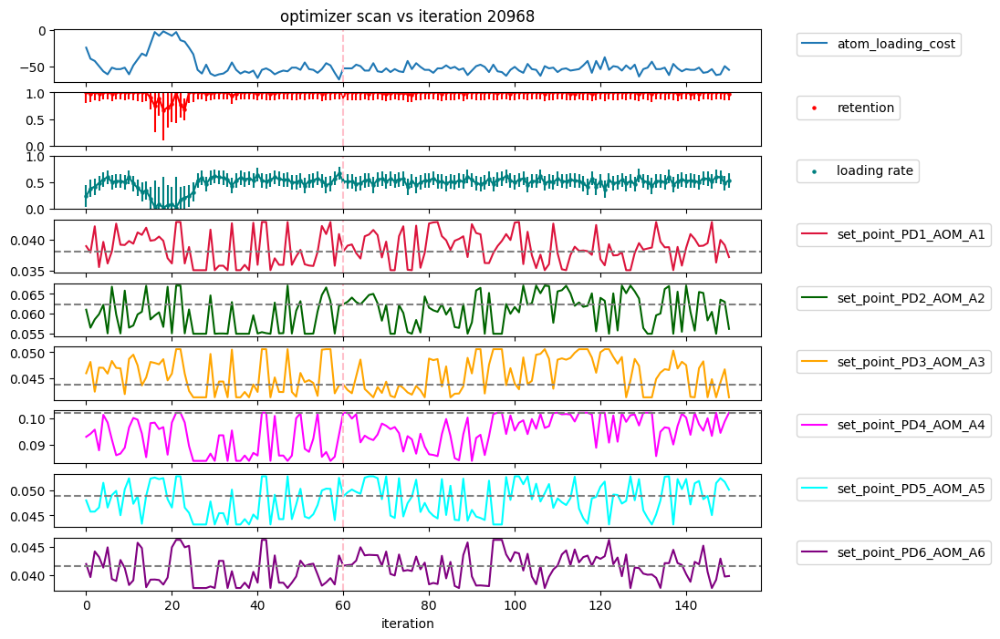

151
151
151
151
151
151


array([-24., -39., -42., -49., -56., -60., -51., -53., -53., -51., -60.,
       -48., -40., -32., -35., -19.,  -3.,  -8.,  -2.,  -5.,  -8.,  -3.,
       -14., -16., -24., -33., -54., -59., -47., -59., -62., -60., -59.,
       -55., -44., -54., -59., -56., -58., -55., -65., -54., -52., -55.,
       -60., -57., -55., -56., -51., -51., -54., -44., -53., -54., -58.,
       -53., -45., -48., -58., -67., -52., -52., -52., -47., -49., -55.,
       -55., -45., -56., -57., -52., -57., -53., -56., -57., -42., -53.,
       -45., -50., -54., -54., -58., -52., -52., -48., -52., -50., -54.,
       -52., -61., -55., -49., -47., -50., -57., -47., -56., -57., -62.,
       -54., -50., -55., -58., -46., -53., -54., -62., -49., -52., -51.,
       -57., -53., -52., -55., -54., -53., -48., -42., -58., -42., -53.,
       -37., -54., -49., -50., -55., -48., -53., -47., -63., -53., -51.,
       -43., -53., -53., -51., -61., -46., -52., -56., -53., -54., -54.,
       -51., -58., -57., -53., -61., -60., -49., -5

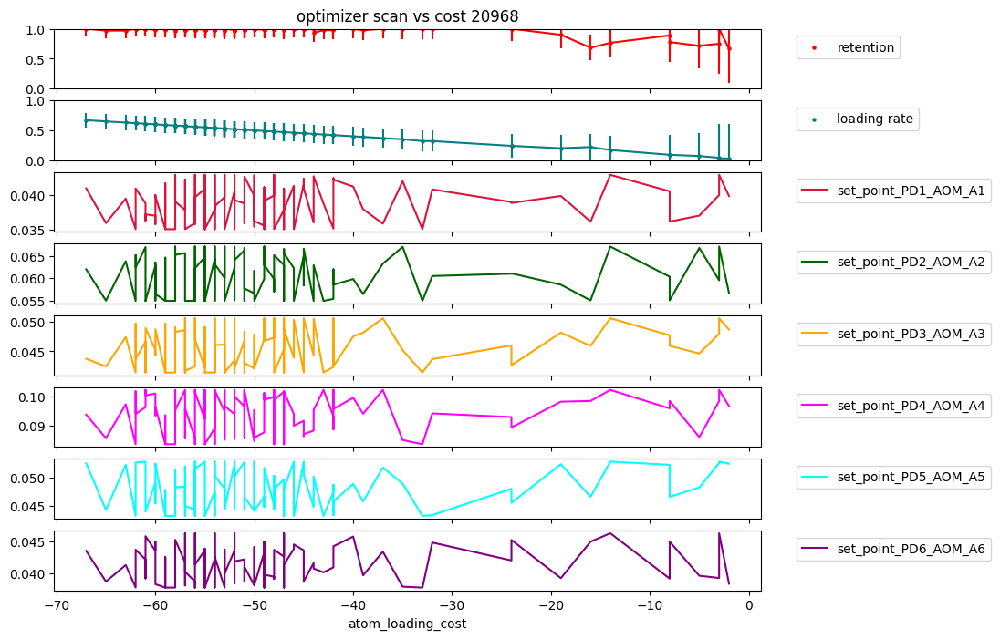

In [3]:
f_idx = 0

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
print("cost:",cost_function)

iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red', s=5)
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal', s=5)
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost) +1 # this gives the correct one

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red', s=5)
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal', s=5)
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    opt_var = locals()[f'optimizer_var{i}'][sorted_idcs]
    print(len(opt_var))
    ax.plot(cost[sorted_idcs], opt_var, label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")
cost

In [196]:
iteration = 1
print(f"cost at iter. {iteration}: {cost[iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"{str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

cost at iter. 1: -85.02303030303032, intitial cost: -75.50833333333335
'AZ_bottom_volts_RO: -0.12320067742418603 (initial:  -0.16989350003278325)
'AZ_top_volts_RO: 0.014041233643476285 (initial:  0.10425041421723118)
'AX_volts_RO: 0.033070813629819604 (initial:  0.08191375530833755)
'AY_volts_RO: -0.008121627895386122 (initial:  0.08784142027983811)


In [182]:
AZ_bottom_volts_RO, AZ_top_volts_RO, AX_volts_RO, AY_volts_RO

(-0.19591673253057626,
 0.17409934096271065,
 0.07822329053330368,
 0.09295943252180991)

### 2024.11.24

In [158]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-24"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 10 files
file 0 (...results\2024-11-24\15\000019550-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (...results\2024-11-24\15\000019551-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 4 (...results\2024-11-24\16\000019553-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 6 (...results\2024-11-24\18\000019565-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_and_loading_cost'
file 8 (...results\2024-11-24\18\000019566-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'", "'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'"] for 'atom_loading_cost'
skipped 5 redundant files
3 scan_variables over 3 variable scans


experiment: atom_loading_experiment
cost: atom_retention_and_loading_cost
override_ExperimentVariables {'dummy_variable':4, 'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_RO',-0.1*V,0.1*V,'diff'), ('AZ_top_volts_RO',-0.1*V,0.1*V,'diff'), ('AX_volts_RO',-0.1*V,0.1*V,'diff'), ('AY_volts_RO',-0.1*V,0.1*V,'diff')]
best cost (iter. 34): -83.18615384615386, intitial cost: -75.50833333333335
best 'AZ_bottom_volts_RO: -0.19539082734400645 (initial:  -0.16989350003278325)
best 'AZ_top_volts_RO: 0.17459272172160634 (initial:  0.10425041421723118)
best 'AX_volts_RO: 0.07874919586349158 (initial:  0.08191375530833755)
best 'AY_volts_RO: 0.09348533784907843 (initial:  0.08784142027983811)
loading rate at best cost: 0.39
retention at best cost: 0.8974358974358975


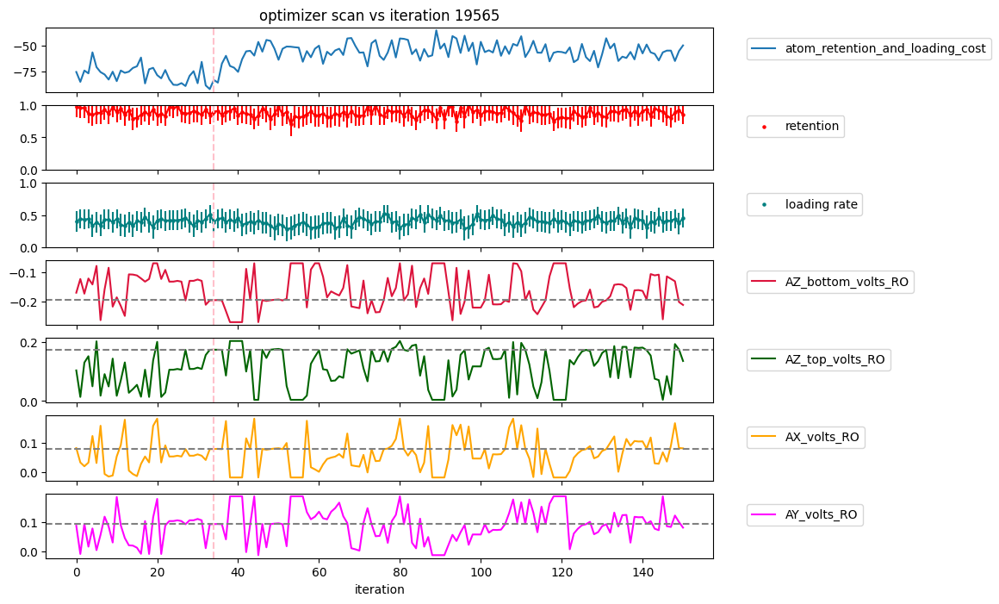

151
151
151
151


array([-75.50833333, -85.0230303 , -74.13635659, -76.86181818,
       -56.66666667, -70.87730769, -75.65960784, -77.9301938 ,
       -82.81325581, -75.25384615, -84.33939394, -74.13404762,
       -76.34454545, -75.25384615, -71.655     , -70.08544715,
       -61.66666667, -86.53826241, -72.94333333, -71.54761905,
       -78.56190476, -81.64787879, -73.66865854, -82.60571429,
       -87.82285714, -88.05904762, -86.24011628, -89.03492754,
       -79.32346154, -74.78742424, -86.3447619 , -65.80435897,
       -88.47242424, -92.01186275, -83.18615385, -85.765     ,
       -67.51944444, -60.        , -69.7655814 , -71.37666667,
       -75.43944444, -63.24074074, -55.70716216, -55.20114943,
       -59.78653153, -46.66666667, -56.01508772, -44.76190476,
       -45.60606061, -53.21428571, -63.82183908, -53.21428571,
       -51.11111111, -51.25      , -51.75287356, -52.12962963,
       -65.70641026, -55.47619048, -61.38888889, -53.21428571,
       -50.27777778, -67.69436937, -56.12318841, -59.33

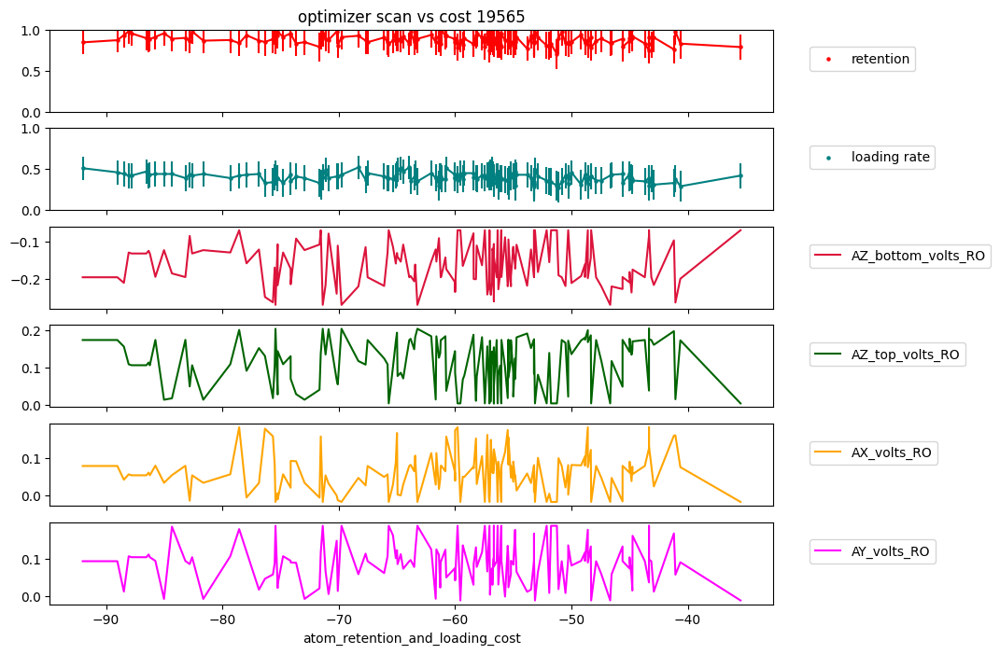

In [195]:
f_idx = 6

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
print("cost:",cost_function)

iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red', s=5)
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal', s=5)
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost) +1 # this gives the correct one

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red', s=5)
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal', s=5)
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    opt_var = locals()[f'optimizer_var{i}'][sorted_idcs]
    print(len(opt_var))
    ax.plot(cost[sorted_idcs], opt_var, label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")
cost

In [196]:
iteration = 1
print(f"cost at iter. {iteration}: {cost[iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"{str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

cost at iter. 1: -85.02303030303032, intitial cost: -75.50833333333335
'AZ_bottom_volts_RO: -0.12320067742418603 (initial:  -0.16989350003278325)
'AZ_top_volts_RO: 0.014041233643476285 (initial:  0.10425041421723118)
'AX_volts_RO: 0.033070813629819604 (initial:  0.08191375530833755)
'AY_volts_RO: -0.008121627895386122 (initial:  0.08784142027983811)


In [182]:
AZ_bottom_volts_RO, AZ_top_volts_RO, AX_volts_RO, AY_volts_RO

(-0.19591673253057626,
 0.17409934096271065,
 0.07822329053330368,
 0.09295943252180991)

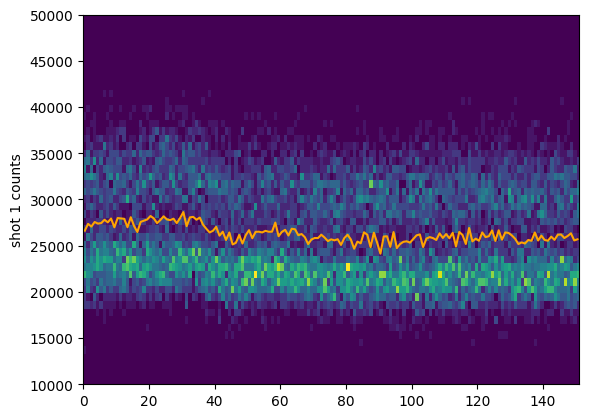

In [191]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.11.22 After more Cooing power

In [156]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-22"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 6 files
file 0 (...results\2024-11-22\12\000019468-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2024-11-22\17\000019548-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 4 (...results\2024-11-22\17\000019549-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_and_loading_cost'
skipped 3 redundant files
1 scan_variables over 1 variable scans


experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_RO',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_RO',-0.05*V,0.05*V,'diff'), ('AX_volts_RO',-0.05*V,0.05*V,'diff'), ('AY_volts_RO',-0.05*V,0.05*V,'diff')]
best cost (iter. 36): -81.88, intitial cost: -58.29710144927537
best 'AZ_bottom_volts_RO: -0.16989350003278325 (initial:  -0.11989350003278326)
best 'AZ_top_volts_RO: 0.10425041421723118 (initial:  0.054250414217231174)
best 'AX_volts_RO: 0.08191375530833755 (initial:  0.03191375530833755)
best 'AY_volts_RO: 0.08784142027983811 (initial:  0.03784142027983812)
loading rate at best cost: 0.5
retention at best cost: 0.92


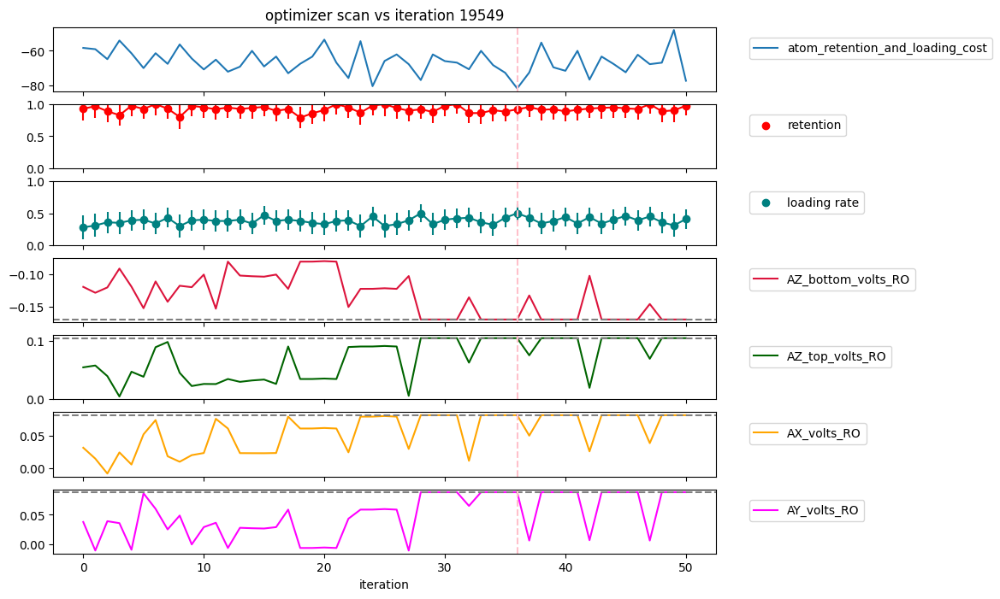

51
51
51
51


array([-58.29710145, -59.04761905, -64.85333333, -53.98148148,
       -61.44346154, -70.04666667, -61.38888889, -67.58372093,
       -56.28205128, -64.46666667, -70.84      , -65.15017544,
       -72.16526316, -69.23333333, -60.        , -69.1120922 ,
       -63.33333333, -73.0625    , -67.54631579, -63.38261905,
       -53.47701149, -66.91385965, -75.85576923, -54.35897436,
       -80.6       , -65.8974359 , -62.09770115, -67.77884615,
       -77.02666667, -62.09770115, -65.99333333, -66.87571429,
       -70.74437984, -60.        , -68.33333333, -72.76852713,
       -81.88      , -72.63174419, -55.20114943, -69.59719298,
       -71.63515152, -60.        , -76.78272727, -63.33333333,
       -67.67666667, -72.50275362, -62.28346154, -67.77      ,
       -66.9       , -47.87878788, -77.44138211])

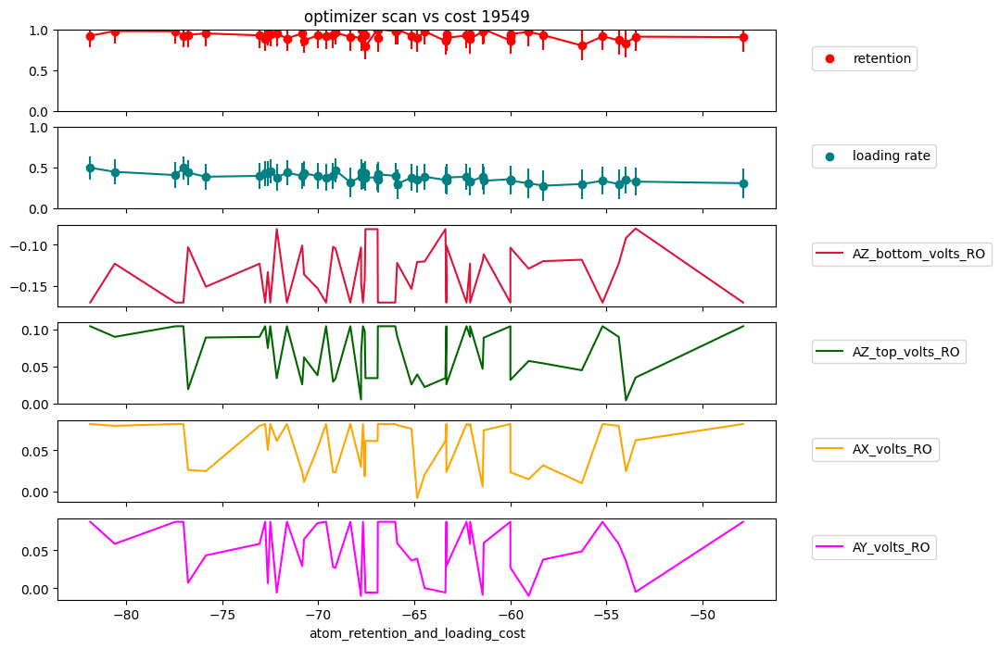

In [157]:
f_idx = 4

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost) # this gives the correct one

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    opt_var = locals()[f'optimizer_var{i}'][sorted_idcs]
    print(len(opt_var))
    ax.plot(cost[sorted_idcs], opt_var, label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")
cost

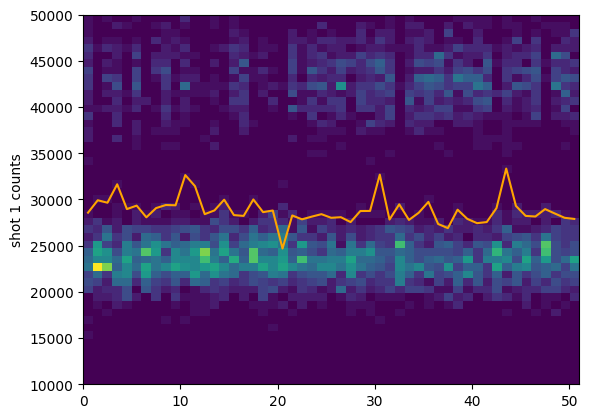

In [154]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.11.17 After MOT Laser Rebuild

In [152]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-17"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 6 files
file 0 (...results\2024-11-17\14\000019141-GeneralVariableOptimizer.h5) optimized ["'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'", "'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 1 (...results\2024-11-17\16\000019150-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'", "'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'"] for 'atom_loading_cost'
file 2 (...results\2024-11-17\20\000019154-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'", "'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_poin

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_MOT',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_MOT',-0.05*V,0.05*V,'diff'), ('AX_volts_MOT',-0.1*V,0.1*V,'diff'), ('AY_volts_MOT',-0.1*V,0.1*V,'diff'), ('set_point_PD1_AOM_A1',0.9,1.1,'perc'), ('set_point_PD2_AOM_A2',0.9,1.1,'perc'), ('set_point_PD3_AOM_A3',0.9,1.1,'perc'), ('set_point_PD4_AOM_A4',0.9,1.1,'perc'), ('set_point_PD5_AOM_A5',0.9,1.1,'perc'), ('set_point_PD6_AOM_A6',0.9,1.1,'perc')]
best cost (iter. 44): -59.0, intitial cost: -32.0
best 'AZ_bottom_volts_MOT: 6.98165043831837 (initial:  7.019)
best 'AZ_top_volts_MOT: 7.49506754131944 (initial:  7.483)
best 'AX_volts_MOT: 0.4638342128635166 (initial:  0.496)
best 'AY_volts_MOT: -0.3499931445466576 (initial:  -0.39)
best 'set_point_PD1_AOM_A1: 0.036300000000000006 (initial:  0.033)
best 'set_point_PD2_AOM_A2: 0.05744441535515948 (initial:  0.061)
best 'set_point_PD3_AOM_A3: 0.04206865323581915 (initial:  0

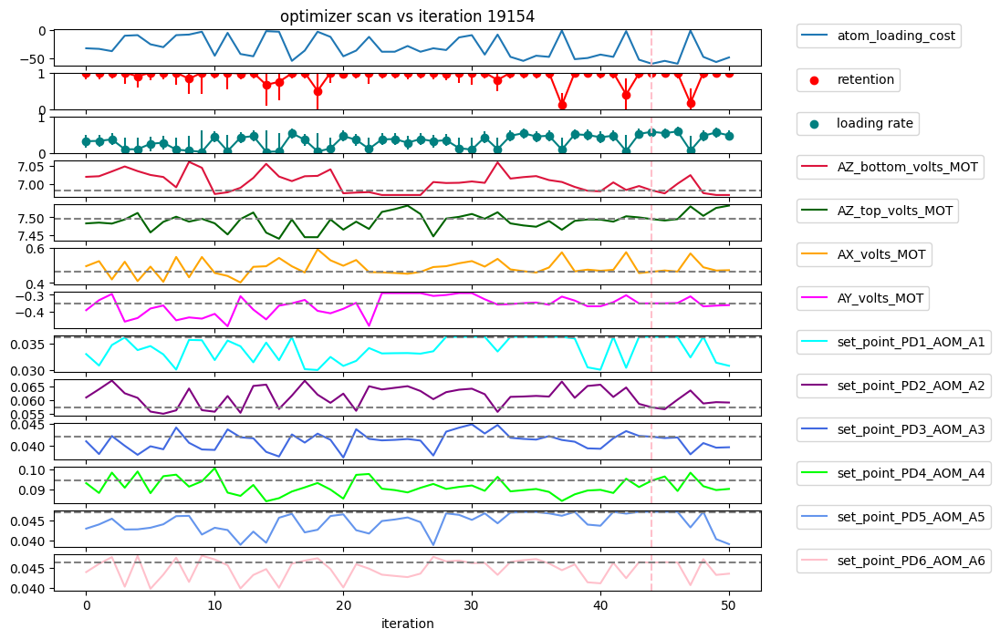

51
51
51
51
51
51
51
51
51
51


array([-32., -33., -37., -10.,  -9., -25., -30.,  -9.,  -8.,  -3., -45.,
        -5., -42., -46.,  -2.,  -3., -54., -36.,  -3., -12., -46., -36.,
       -12., -38., -38., -28., -38., -32., -35., -13.,  -9., -43.,  -8.,
       -47., -54., -45., -47.,  -1., -51., -49., -43., -47.,  -2., -52.,
       -59., -54., -59.,  -1., -47., -56., -48.])

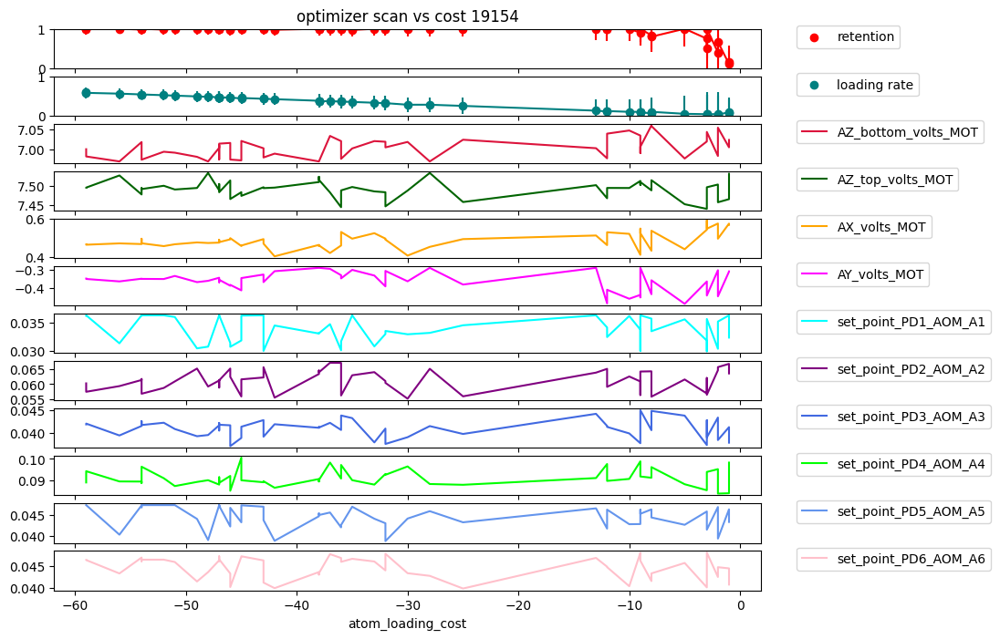

In [155]:
f_idx = 2

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost) # this gives the correct one

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    opt_var = locals()[f'optimizer_var{i}'][sorted_idcs]
    print(len(opt_var))
    ax.plot(cost[sorted_idcs], opt_var, label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")
cost

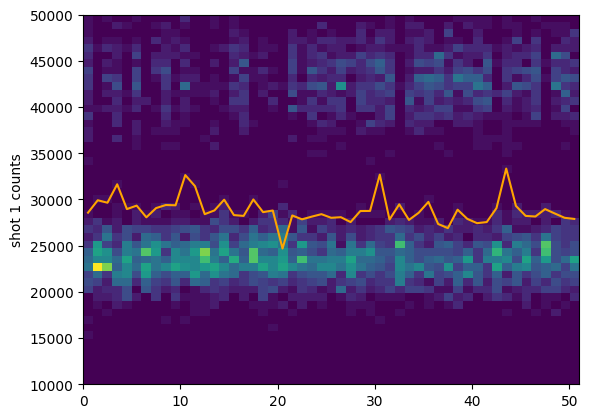

In [154]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.11.08

In [145]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-08"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 8 files
file 0 (...results\2024-11-08\09\000019064-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_cost'
file 2 (...results\2024-11-08\10\000019066-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 4 (...results\2024-11-08\11\000019067-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_and_loading_cost'
file 6 (...results\2024-11-08\12\000019069-GeneralVariableOptimizer_atom_loading_optimized_for_atom_retention_and_loading.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_and_loading_cost'
file 7 (...results\2024-11-08\12\000019070-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_t

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_MOT',-0.03*V,0.03*V,'diff'), ('AZ_top_volts_MOT',-0.03*V,0.03*V,'diff'), ('AX_volts_MOT',-0.07*V,0.07*V,'diff'), ('AY_volts_MOT',-0.07*V,0.07*V,'diff')]
best cost (iter. 3): -40.0, intitial cost: -14.000000000000002
best 'AZ_bottom_volts_MOT: 6.792866340195949 (initial:  6.818115150903059)
best 'AZ_top_volts_MOT: 7.244518850482369 (initial:  7.227414323129696)
best 'AX_volts_MOT: 0.546496246286349 (initial:  0.5789903506887325)
best 'AY_volts_MOT: -0.2383127515286812 (initial:  -0.23511945383197444)
loading rate at best cost: 0.39
retention at best cost: 0.9487179487179487


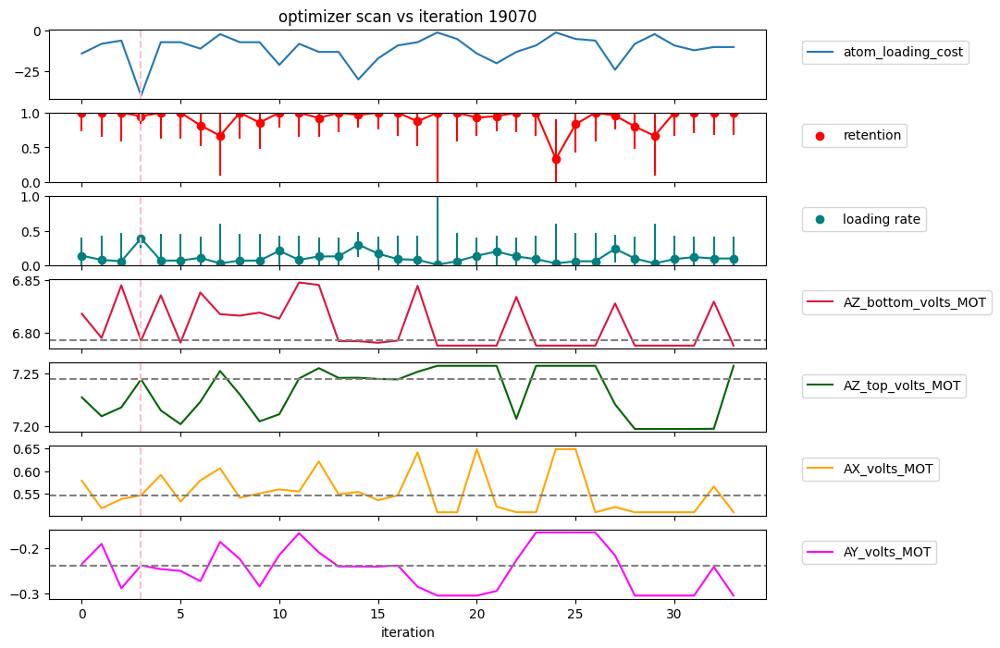

34
34
34
34


Text(0.5, 0, 'atom_loading_cost')

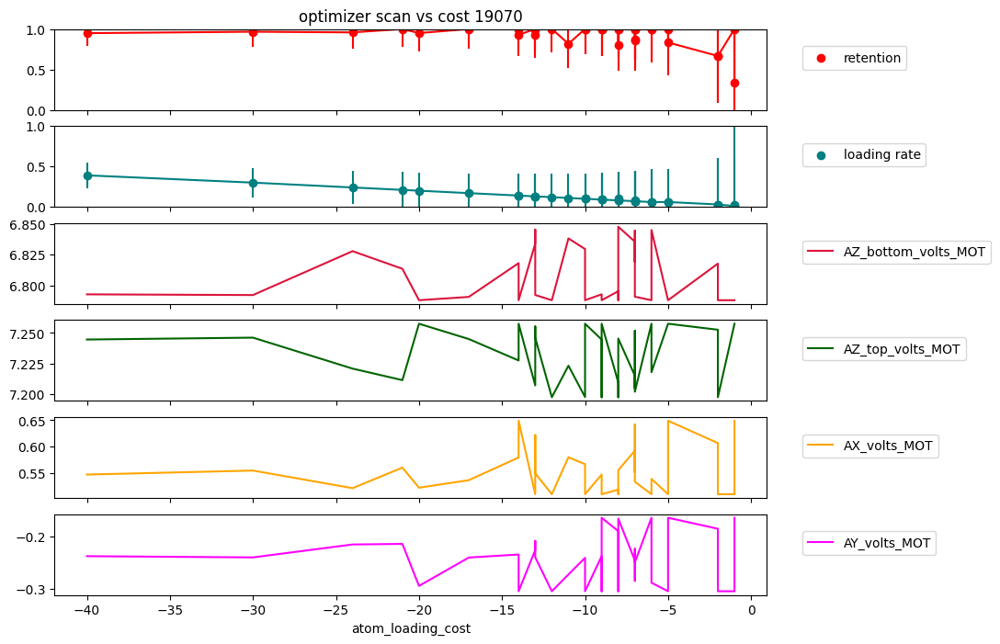

In [146]:
f_idx = 7

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost) # this gives the correct one

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    opt_var = locals()[f'optimizer_var{i}'][sorted_idcs]
    print(len(opt_var))
    ax.plot(cost[sorted_idcs], opt_var, label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")


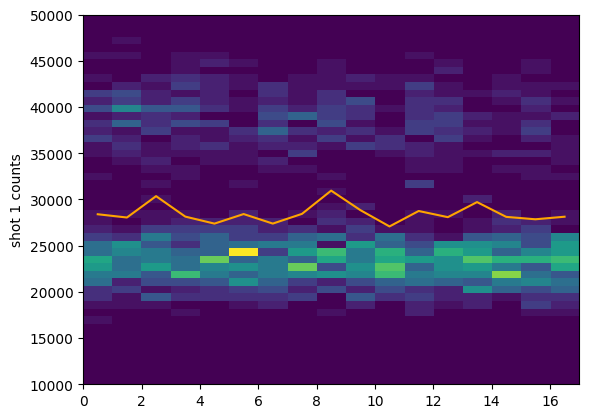

In [144]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.11.07

In [126]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-07"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 11 files
file 0 (...results\2024-11-07\09\000019021-GeneralVariableOptimizer_atom_loading_optimized_for_atom_retention.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_retention_cost'
file 1 (...results\2024-11-07\09\000019022-GeneralVariableOptimizer_atom_loading_optimized_for_atom_retention.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_retention_cost'
file 2 (...results\2024-11-07\09\000019023-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 3 (...results\2024-11-07\09\000019024-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 4 (...results\2024-11-07\12\000019038-GeneralVariabl

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_MOT',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_MOT',-0.05*V,0.05*V,'diff'), ('AX_volts_MOT',-0.1*V,0.1*V,'diff'), ('AY_volts_MOT',-0.1*V,0.1*V,'diff'), ('set_point_PD1_AOM_A1',0.9,1.1,'perc'), ('set_point_PD2_AOM_A2',0.9,1.1,'perc'), ('set_point_PD3_AOM_A3',0.9,1.1,'perc'), ('set_point_PD4_AOM_A4',0.9,1.1,'perc'), ('set_point_PD5_AOM_A5',0.9,1.1,'perc'), ('set_point_PD6_AOM_A6',0.9,1.1,'perc')]
best cost (iter. 38): -41.0, intitial cost: -5.0
best 'AZ_bottom_volts_MOT: 6.83438076982737 (initial:  6.852202245309456)
best 'AZ_top_volts_MOT: 7.2446944868613565 (initial:  7.230885708730981)
best 'AX_volts_MOT: 0.5920660191163446 (initial:  0.5430349024304216)
best 'AY_volts_MOT: -0.1967550334925026 (initial:  -0.27042615705974915)
best 'set_point_PD1_AOM_A1: 0.02988163342268615 (initial:  0.030499236273951465)
best 'set_point_PD2_AOM_A2: 0.058638587095073594 (initial: 

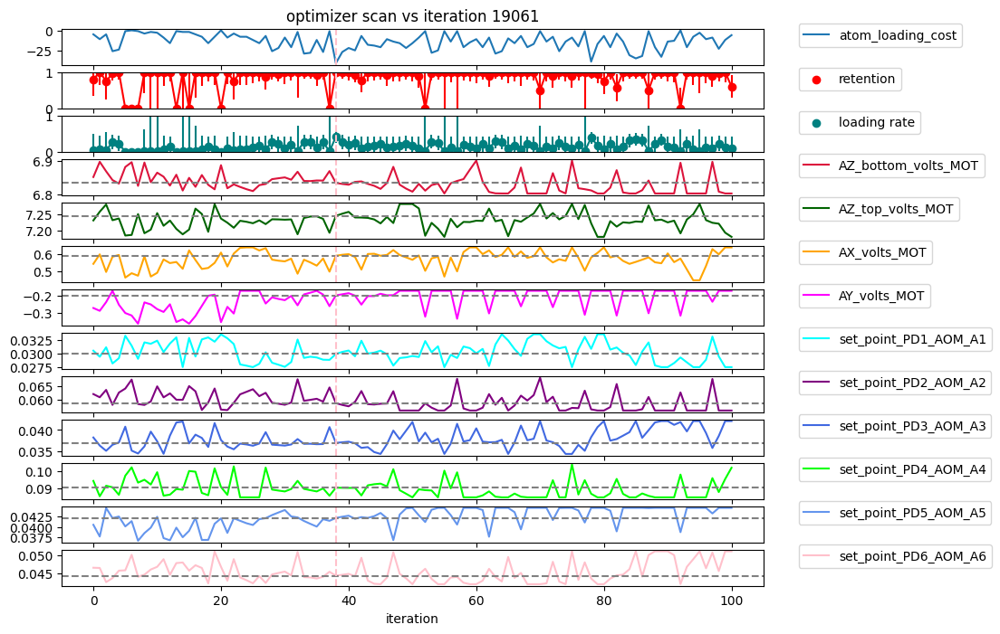

101
101
101
101
101
101
101
101
101
101


Text(0.5, 0, 'atom_loading_cost')

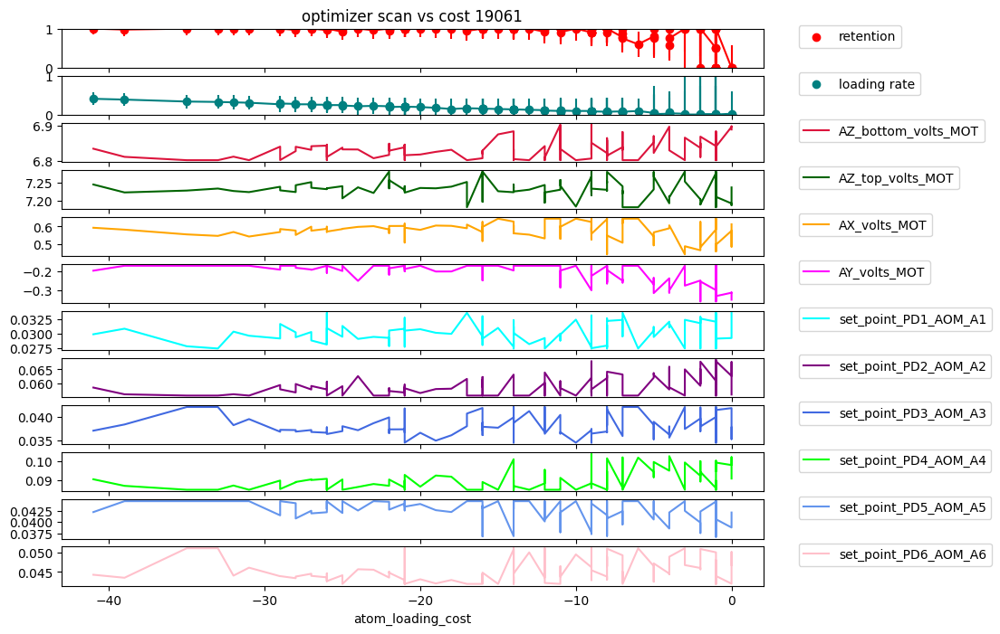

In [133]:
f_idx = 7

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost) # this gives the correct one

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    opt_var = locals()[f'optimizer_var{i}'][sorted_idcs]
    print(len(opt_var))
    ax.plot(cost[sorted_idcs], opt_var, label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")


In [113]:
loading_rate

array([0.13, 0.03, 0.04, 0.05, 0.01, 0.  , 0.  , 0.02, 0.09, 0.02, 0.01,
       0.07, 0.01, 0.18, 0.19, 0.05, 0.08, 0.02, 0.11, 0.12, 0.09, 0.14,
       0.01, 0.2 , 0.12, 0.1 , 0.12, 0.  , 0.24, 0.13, 0.03, 0.29, 0.01,
       0.33, 0.44, 0.39, 0.25, 0.03, 0.33, 0.23, 0.34, 0.36, 0.03, 0.32,
       0.21, 0.25, 0.38])

In [111]:
cost

array([-14.,  -4.,  -4.,  -7.,  -1.,  -2.,  -2.,  -2., -10.,  -4.,  -1.,
        -7.,  -2., -18., -20.,  -5.,  -8.,  -2., -13., -12.,  -9., -14.,
        -1., -20., -12., -11., -13.,  -0., -24., -13.,  -1., -29.,  -1.,
       -33., -44., -39., -25.,  -1., -33., -23., -34., -36.,  -0., -32.,
       -21., -25., -38.])

In [104]:
set_point_PD1_AOM_A1, set_point_PD2_AOM_A2, set_point_PD3_AOM_A3, set_point_PD4_AOM_A4, set_point_PD5_AOM_A5, set_point_PD6_AOM_A6

(0.030499236273951465,
 0.0620558249010917,
 0.03825802985906763,
 0.09440107326086258,
 0.04052831623172069,
 0.046532179779710574)

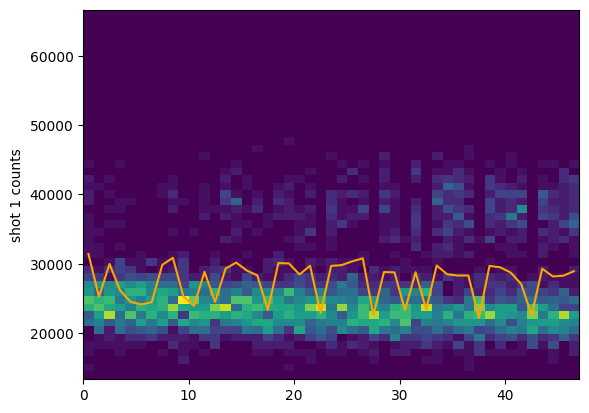

In [99]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.11.06
changes:

scanning over n_measurements = 100

best_cost_iteration = np.argmin(cost) # this gives the correct one

In [118]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-06"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 43 files
file 0 (...results\2024-11-06\09\000018949-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 1 (...results\2024-11-06\10\000018953-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 3 (...results\2024-11-06\12\000018956-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 5 (...results\2024-11-06\13\000018958-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 7 (...results\2024-11-06\13\000018959-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 9 (...results\2024-11-06\13\000018960-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (...results\2024-11-06\13\000018962-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 12 (...results\2024-11-06\13\000018964-GeneralVariableOptimizer_atom_load

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_MOT',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_MOT',-0.05*V,0.05*V,'diff'), ('AX_volts_MOT',-0.1*V,0.1*V,'diff'), ('AY_volts_MOT',-0.1*V,0.1*V,'diff')]
best cost (iter. 21): -50.0, intitial cost: -22.0
best 'AZ_bottom_volts_MOT: 7.009944891170483 (initial:  7.042)
best 'AZ_top_volts_MOT: 7.48744268436124 (initial:  7.475)
best 'AX_volts_MOT: 0.41288357314829177 (initial:  0.443)
best 'AY_volts_MOT: -0.2906520378316304 (initial:  -0.251)
loading rate at best cost: 0.51
retention at best cost: 0.9803921568627451


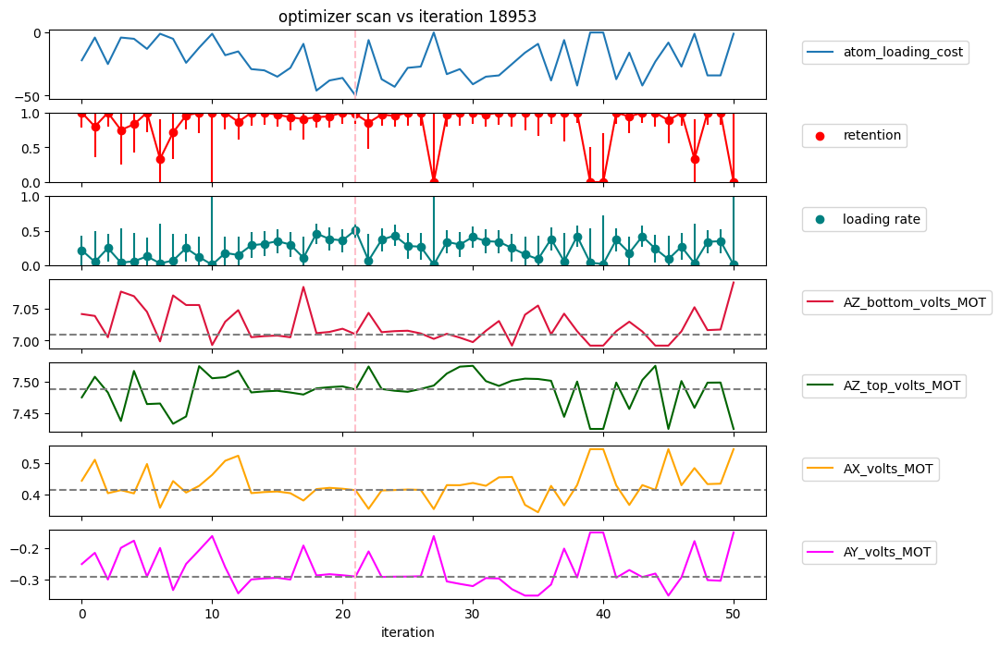

51
51
51
51


Text(0.5, 0, 'atom_loading_cost')

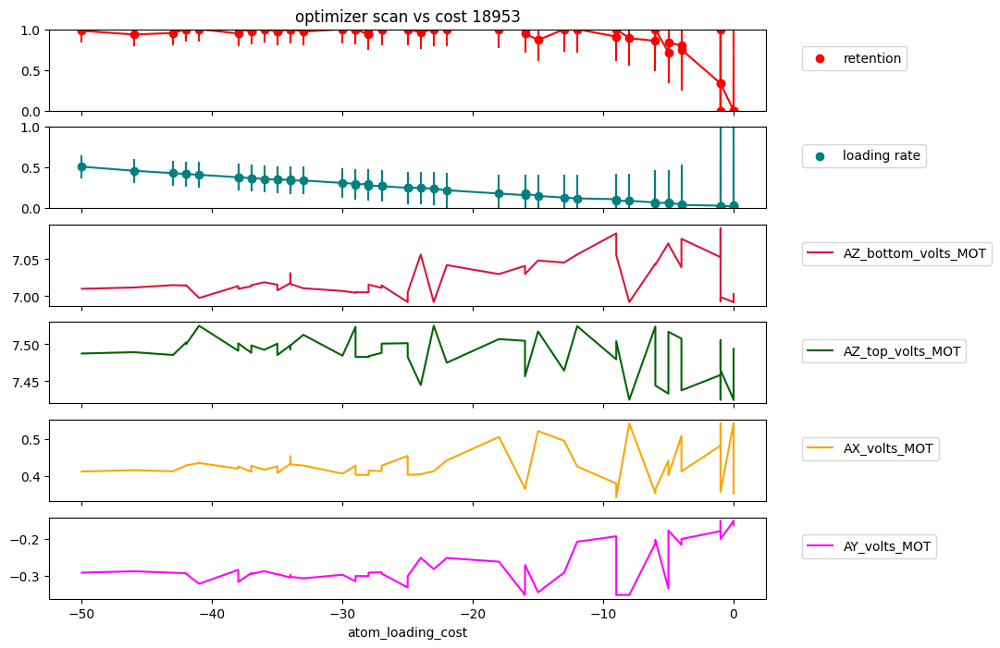

In [117]:
f_idx = 1

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost) # this gives the correct one

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    opt_var = locals()[f'optimizer_var{i}'][sorted_idcs]
    print(len(opt_var))
    ax.plot(cost[sorted_idcs], opt_var, label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")


In [113]:
loading_rate

array([0.13, 0.03, 0.04, 0.05, 0.01, 0.  , 0.  , 0.02, 0.09, 0.02, 0.01,
       0.07, 0.01, 0.18, 0.19, 0.05, 0.08, 0.02, 0.11, 0.12, 0.09, 0.14,
       0.01, 0.2 , 0.12, 0.1 , 0.12, 0.  , 0.24, 0.13, 0.03, 0.29, 0.01,
       0.33, 0.44, 0.39, 0.25, 0.03, 0.33, 0.23, 0.34, 0.36, 0.03, 0.32,
       0.21, 0.25, 0.38])

In [111]:
cost

array([-14.,  -4.,  -4.,  -7.,  -1.,  -2.,  -2.,  -2., -10.,  -4.,  -1.,
        -7.,  -2., -18., -20.,  -5.,  -8.,  -2., -13., -12.,  -9., -14.,
        -1., -20., -12., -11., -13.,  -0., -24., -13.,  -1., -29.,  -1.,
       -33., -44., -39., -25.,  -1., -33., -23., -34., -36.,  -0., -32.,
       -21., -25., -38.])

In [104]:
set_point_PD1_AOM_A1, set_point_PD2_AOM_A2, set_point_PD3_AOM_A3, set_point_PD4_AOM_A4, set_point_PD5_AOM_A5, set_point_PD6_AOM_A6

(0.030499236273951465,
 0.0620558249010917,
 0.03825802985906763,
 0.09440107326086258,
 0.04052831623172069,
 0.046532179779710574)

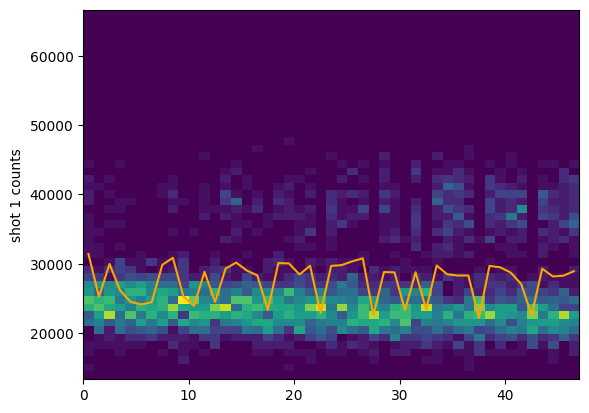

In [99]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.11.04

In [74]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-04"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 5 files
file 0 (...results\2024-11-04\09\000018842-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 1 (...results\2024-11-04\14\000018877-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 2 (...results\2024-11-04\15\000018879-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 3 (...results\2024-11-04\15\000018880-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
skipped 1 redundant files
0 scan_variables over 0 variable scans


In [ ]:
len()

In [77]:
len(cost), len(retention)

(51, 51)

In [80]:
cost[:5]

array([-4.66666667, -5.33333333, -2.66666667, -0.66666667, -2.        ])

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_MOT',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_MOT',-0.05*V,0.05*V,'diff'), ('AX_volts_MOT',-0.1*V,0.1*V,'diff'), ('AY_volts_MOT',-0.1*V,0.1*V,'diff')]
best cost (iter. 37): -0.0, intitial cost: -4.666666666666667
best 'AZ_bottom_volts_MOT: 7.004778362359923 (initial:  6.9941024839833315)
best 'AZ_top_volts_MOT: 7.445965371347776 (initial:  7.441)
best 'AX_volts_MOT: 0.6024564143625604 (initial:  0.538)
best 'AY_volts_MOT: -0.13333776985368878 (initial:  -0.21)
loading rate at best cost: 0.006666666666666667
retention at best cost: 0.0


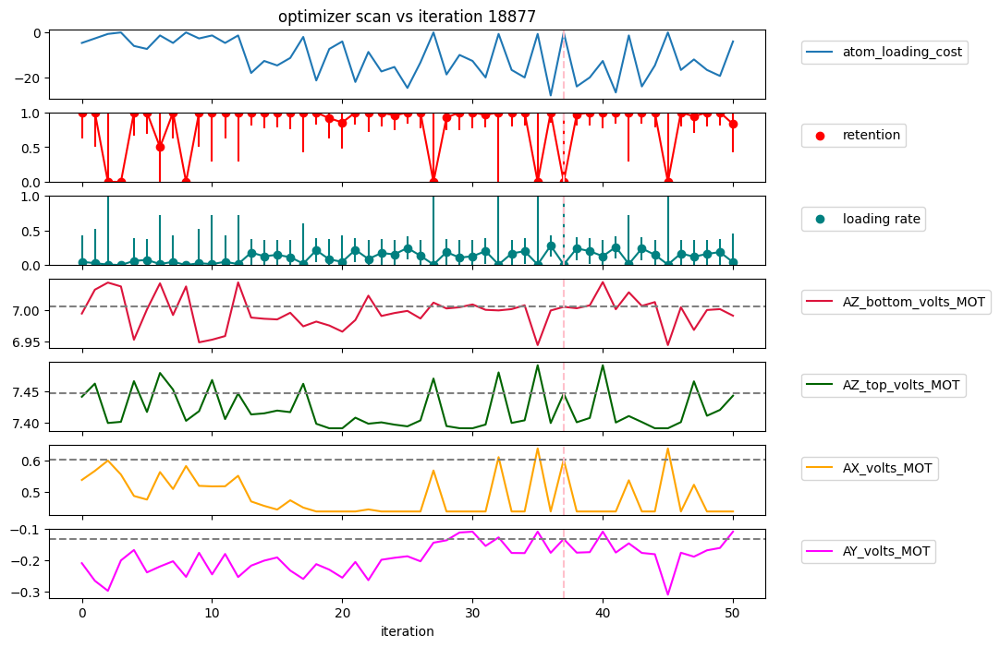

51
51
51
51


Text(0.5, 0, 'atom_loading_cost')

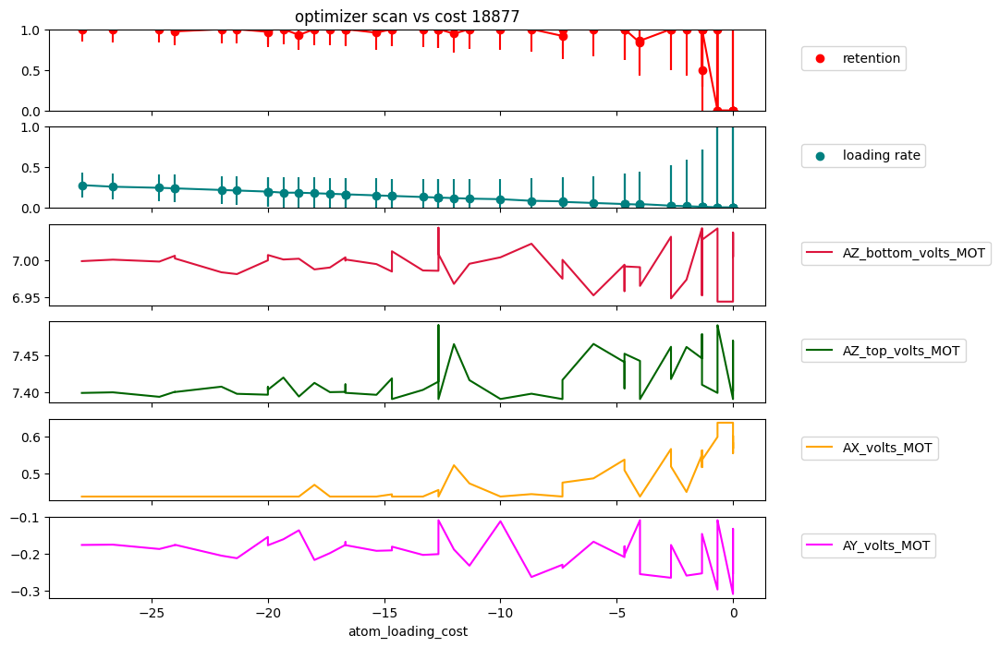

In [88]:
f_idx = 1

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost) + 1 # remove -1 maybe

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    opt_var = locals()[f'optimizer_var{i}'][sorted_idcs]
    print(len(opt_var))
    ax.plot(cost[sorted_idcs], opt_var, label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

In [89]:
set_point_PD1_AOM_A1, set_point_PD2_AOM_A2, set_point_PD3_AOM_A3, set_point_PD4_AOM_A4, set_point_PD5_AOM_A5, set_point_PD6_AOM_A6

(0.030499236273951465,
 0.0620558249010917,
 0.03825802985906763,
 0.09440107326086258,
 0.04052831623172069,
 0.046532179779710574)

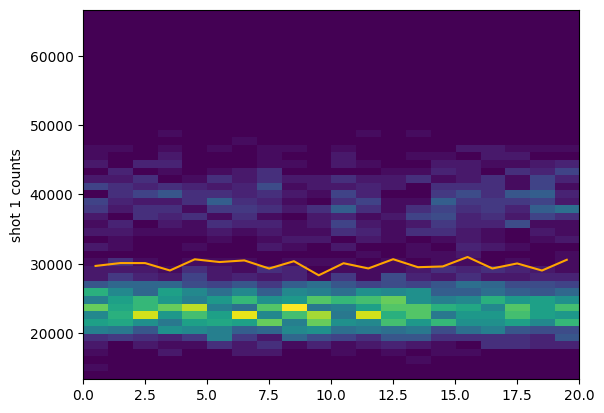

In [73]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.11.03

In [70]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-03"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 18 files
file 0 (...results\2024-11-03\09\000018806-GeneralVariableScan.h5) scanned over dummy_variable
file 2 (...results\2024-11-03\09\000018808-GeneralVariableScan.h5) scanned over dummy_variable
file 4 (...results\2024-11-03\09\000018810-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (...results\2024-11-03\09\000018813-GeneralVariableScan.h5) scanned over dummy_variable
file 7 (...results\2024-11-03\09\000018815-GeneralVariableScan.h5) scanned over dummy_variable
file 9 (...results\2024-11-03\10\000018817-GeneralVariableScan.h5) scanned over dummy_variable
file 11 (...results\2024-11-03\10\000018823-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 13 (...results\2024-11-03\16\000018825-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_MOT',-0.01*V,0.01*V,'diff'), ('AZ_top_volts_MOT',-0.01*V,0.01*V,'diff'), ('AX_volts_MOT',-0.03*V,0.03*V,'diff'), ('AY_volts_MOT',-0.03*V,0.03*V,'diff')]
best cost (iter. 18): -34.66666666666667, intitial cost: -20.0
best 'AZ_bottom_volts_MOT: 7.004102483983331 (initial:  7.014102483983331)
best 'AZ_top_volts_MOT: 7.4412011918024135 (initial:  7.44)
best 'AX_volts_MOT: 0.5383927571008101 (initial:  0.5683927571008102)
best 'AY_volts_MOT: -0.21004762790328882 (initial:  -0.18004762790328882)
loading rate at best cost: 0.3466666666666667
retention at best cost: 1.0


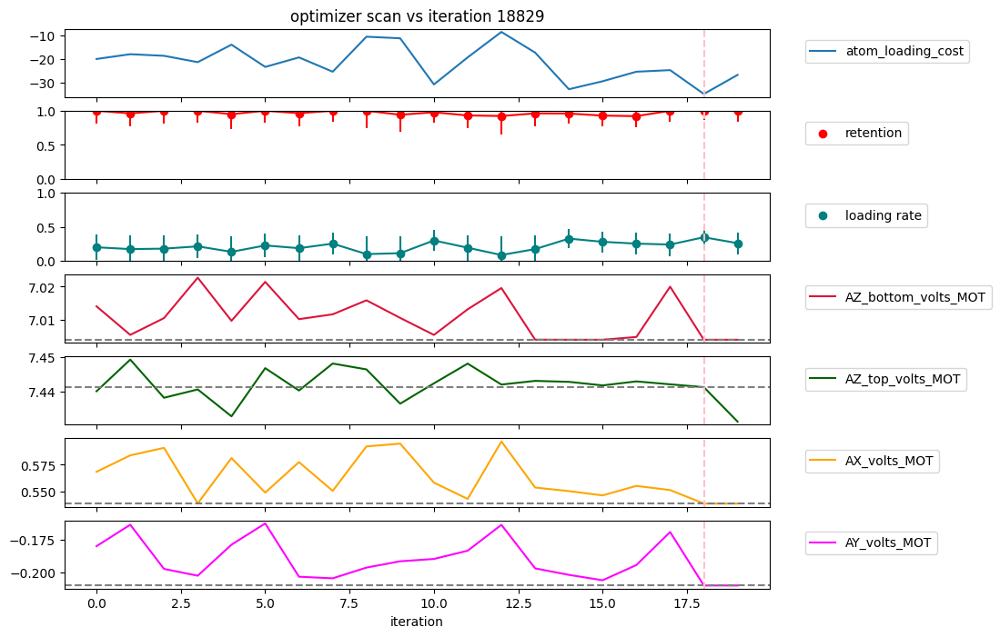

Text(0.5, 0, 'atom_loading_cost')

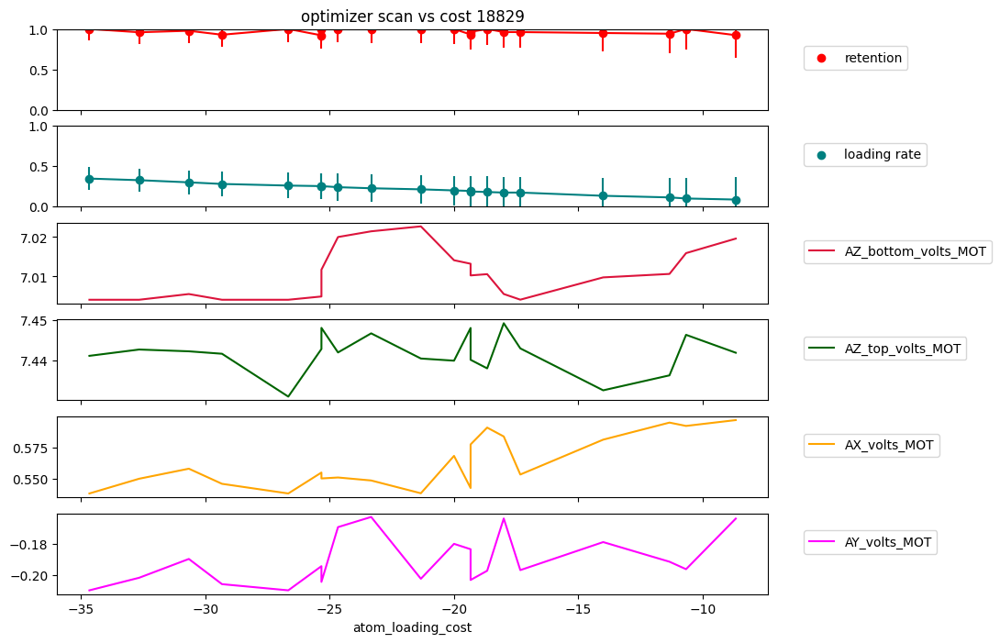

In [72]:
f_idx = 15

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

In [65]:
set_best_parameters_at_finish
t_MOT_loading

0.2

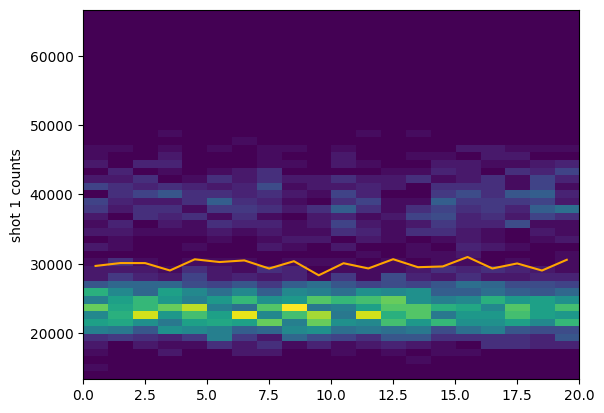

In [73]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.11.02

In [58]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-02"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 8 files
file 0 (...results\2024-11-02\09\000018758-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_loading_cost'
file 1 (...results\2024-11-02\16\000018770-GeneralVariableScan.h5) scanned over t_MOT_dissipation
file 3 (...results\2024-11-02\16\000018771-GeneralVariableScan.h5) scanned over t_MOT_dissipation
file 5 (...results\2024-11-02\18\000018793-GeneralVariableScan.h5) scanned over t_MOT_dissipation
file 6 (...results\2024-11-02\18\000018803-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_cost'
skipped 3 redundant files
1 scan_variables over 3 variable scans


experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_RO',-0.1*V,0.5*V,'abs'), ('AZ_top_volts_RO',-0.1*V,0.5*V,'abs'), ('AX_volts_RO',-0.5*V,0.5*V,'abs'), ('AY_volts_RO',-0.5*V,0.5*V,'abs')]
best cost (iter. 18): -100.0, intitial cost: -50.0
best 'AZ_bottom_volts_RO: 0.10752963439203837 (initial:  -0.509918126553013)
best 'AZ_top_volts_RO: 0.46884345819656686 (initial:  -0.06459590416990468)
best 'AX_volts_RO: -0.0323718051655037 (initial:  -0.20376977073393132)
best 'AY_volts_RO: 0.4279429431264802 (initial:  0.5204542748512576)
loading rate at best cost: 0.4066666666666667
retention at best cost: 1.0


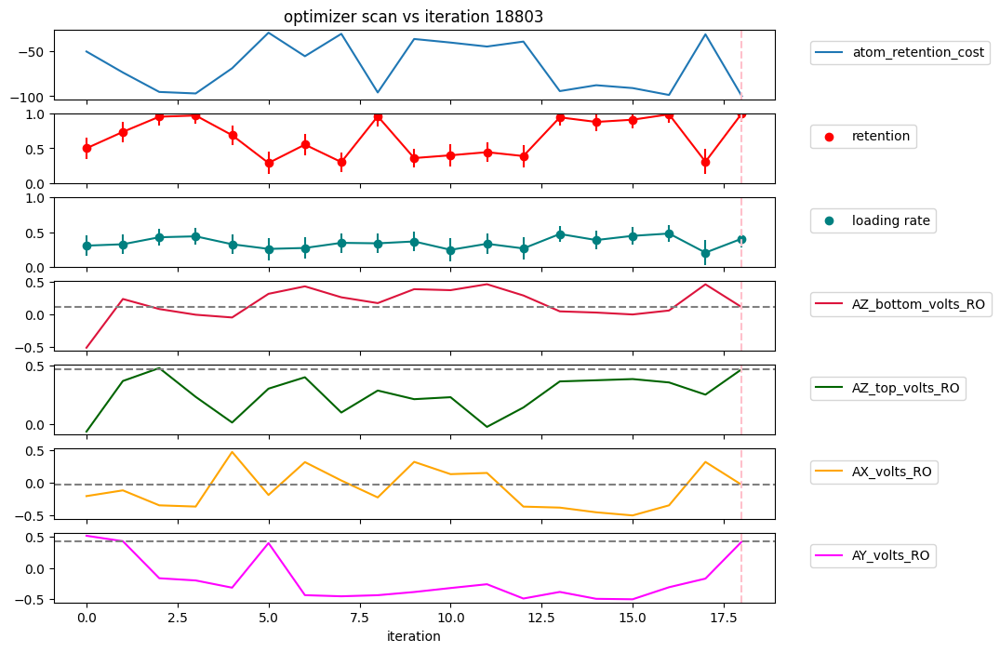

Text(0.5, 0, 'atom_retention_cost')

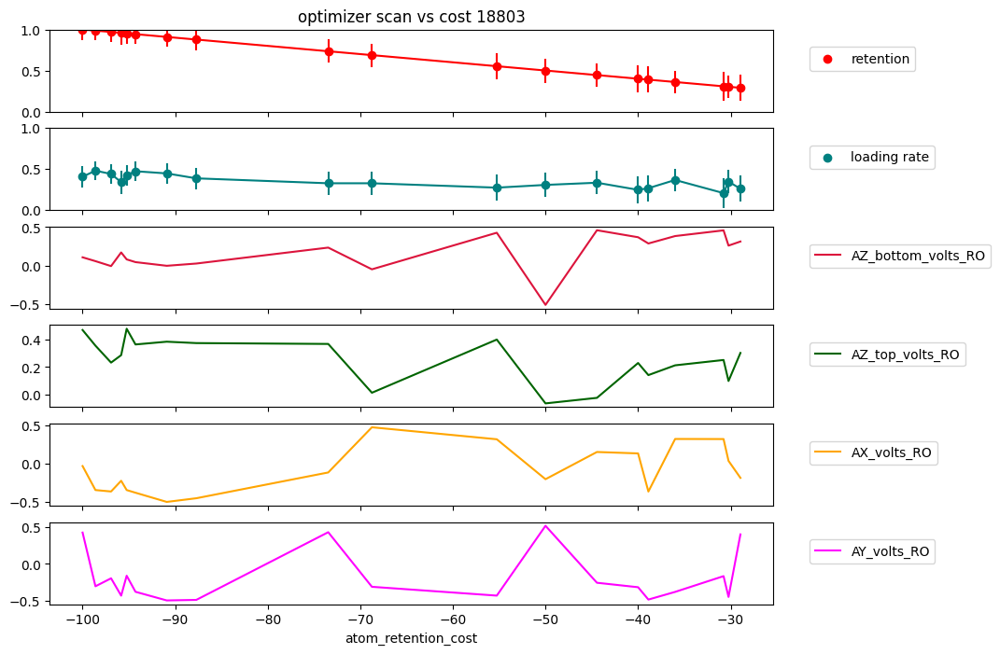

In [59]:
f_idx = 6 #

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

In [62]:
#  ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"]
# AZ_bottom_volts_RO
# AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"
print(AZ_bottom_volts_MOT)
print(AZ_top_volts_MOT)
print(AX_volts_MOT)
print(AY_volts_MOT)
print(t_MOT_loading)

7.039354193637957
7.489918231103317
0.5224353136097232
-0.1997139260168568
0.5


In [51]:
set_best_parameters_at_finish

False

### 2024.11.01

In [47]:
fnames = get_files_by_criteria(date_filters=[ "2024-11-01"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 25 files
file 0 (...results\2024-11-01\13\000018735-GeneralVariableScan.h5) scanned over t_PGC_after_loading
file 2 (...results\2024-11-01\14\000018736-GeneralVariableOptimizer_atom_loading_optimized_for_atom_retention.h5) optimized ["'AZ_bottom_volts_PGC'", "'AZ_top_volts_PGC'", "'AX_volts_PGC'", "'AY_volts_PGC'"] for 'atom_retention_cost'
file 3 (...results\2024-11-01\14\000018738-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_PGC'", "'AZ_top_volts_PGC'", "'AX_volts_PGC'", "'AY_volts_PGC'"] for 'atom_retention_cost'
file 4 (...results\2024-11-01\14\000018740-GeneralVariableScan.h5) scanned over AX_volts_PGC
file 6 (...results\2024-11-01\14\000018741-GeneralVariableScan.h5) scanned over AY_volts_PGC
file 8 (...results\2024-11-01\15\000018742-GeneralVariableScan.h5) scanned over AZ_bottom_volts_PGC
file 10 (...results\2024-11-01\15\000018743-GeneralVariableScan.h5) scanned over AZ_top_volts_PGC
file 12 (...results\2024-11-01\16\000018745-GeneralVariableScan.h5) scanned

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_RO',-0.1*V,0.1*V,'diff'), ('AZ_top_volts_RO',-0.1*V,0.1*V,'diff'), ('AX_volts_RO',-0.1*V,0.1*V,'diff'), ('AY_volts_RO',-0.1*V,0.1*V,'diff')]
best cost (iter. 0): 0.0, intitial cost: 0.0
best 'AZ_bottom_volts_RO: -0.509918126553013 (initial:  -0.509918126553013)
best 'AZ_top_volts_RO: -0.06459590416990468 (initial:  -0.06459590416990468)
best 'AX_volts_RO: -0.20376977073393132 (initial:  -0.20376977073393132)
best 'AY_volts_RO: 0.5204542748512576 (initial:  0.5204542748512576)
loading rate at best cost: 0.0
retention at best cost: -0.0


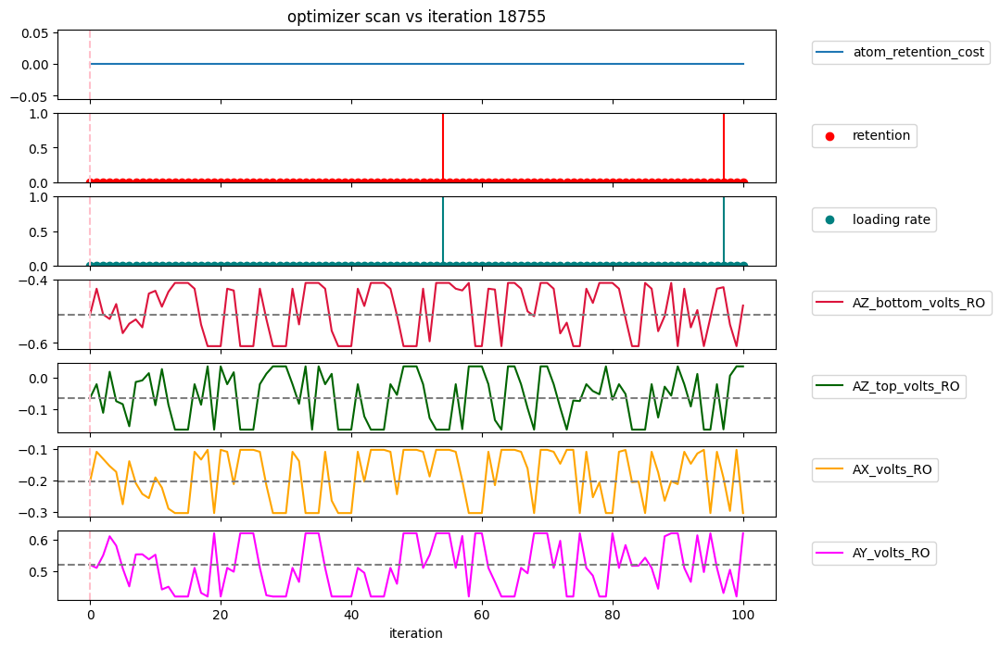

Text(0.5, 0, 'atom_retention_cost')

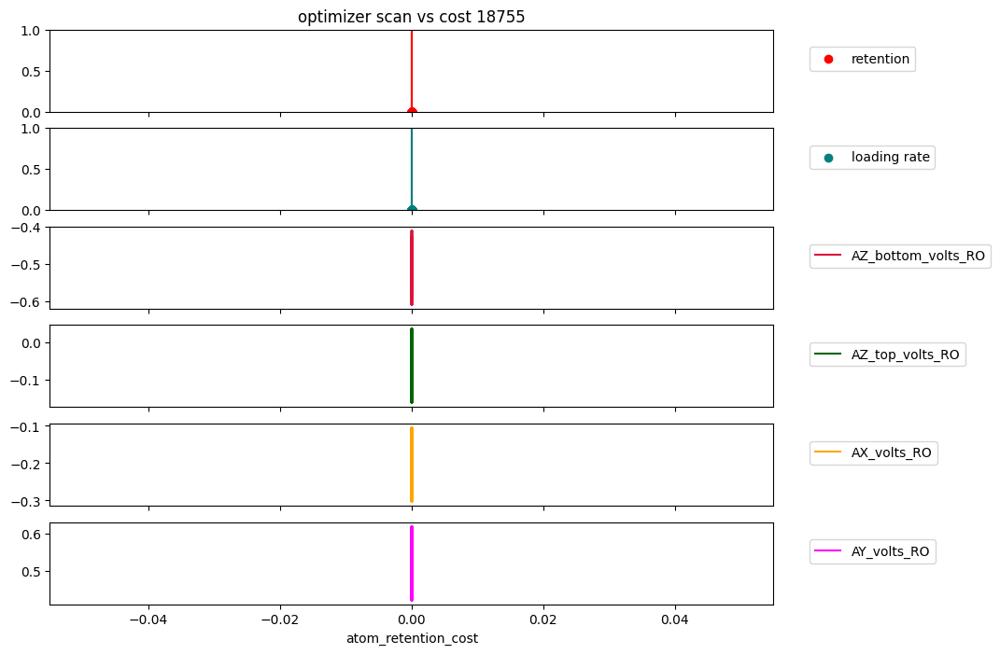

In [48]:
f_idx = 23 #

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

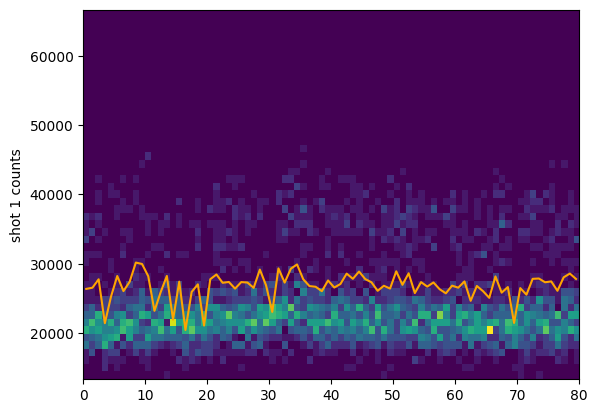

In [33]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.10.31

In [35]:
fnames = get_files_by_criteria(date_filters=[ "2024-10-31"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 19 files
file 0 (...results\2024-10-31\15\000018684-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'", "'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'"] for 'atom_loading_cost'
file 1 (...results\2024-10-31\15\000018685-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'", "'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'"] for 'atom_loading_cost'
file 2 (...results\2024-10-31\15\000018690-GeneralVariableScan.h5) scanned over dummy_variable
file 4 (...results\2024-10-31\15\000018691-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (...results\2024-10-31\15\000018692-GeneralVariableScan.

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_MOT',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_MOT',-0.05*V,0.05*V,'diff'), ('AX_volts_MOT',-0.1*V,0.1*V,'diff'), ('AY_volts_MOT',-0.1*V,0.1*V,'diff'), ('set_point_PD1_AOM_A1',0.9,1.2,'perc'), ('set_point_PD2_AOM_A2',0.9,1.2,'perc'), ('set_point_PD3_AOM_A3',0.9,1.2,'perc'), ('set_point_PD4_AOM_A4',0.9,1.2,'perc'), ('set_point_PD5_AOM_A5',0.9,1.2,'perc'), ('set_point_PD6_AOM_A6',0.9,1.2,'perc')]
best cost (iter. 38): -18.571428571428573, intitial cost: -1.4285714285714286
best 'AZ_bottom_volts_MOT: 7.099016236126168 (initial:  7.049016236126168)
best 'AZ_top_volts_MOT: 7.344661912762451 (initial:  7.356785072336273)
best 'AX_volts_MOT: 0.6810778284424583 (initial:  0.659615468813663)
best 'AY_volts_MOT: -0.10056910619068911 (initial:  -0.000569106190689106)
best 'set_point_PD1_AOM_A1: 0.04458390986832238 (initial:  0.04343330633384451)
best 'set_point_PD2_AOM_A2: 0.

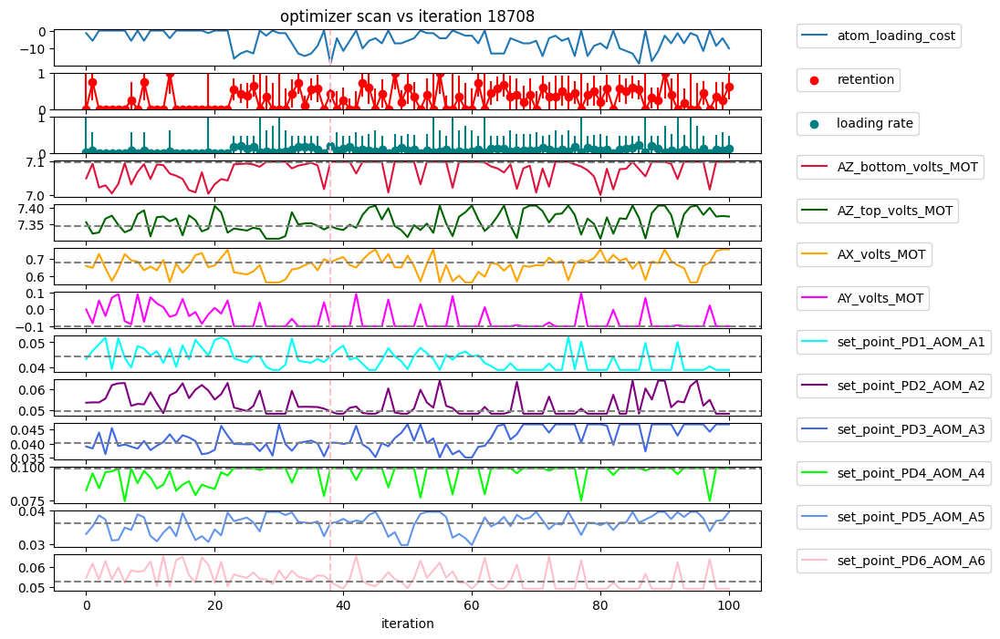

Text(0.5, 0, 'atom_loading_cost')

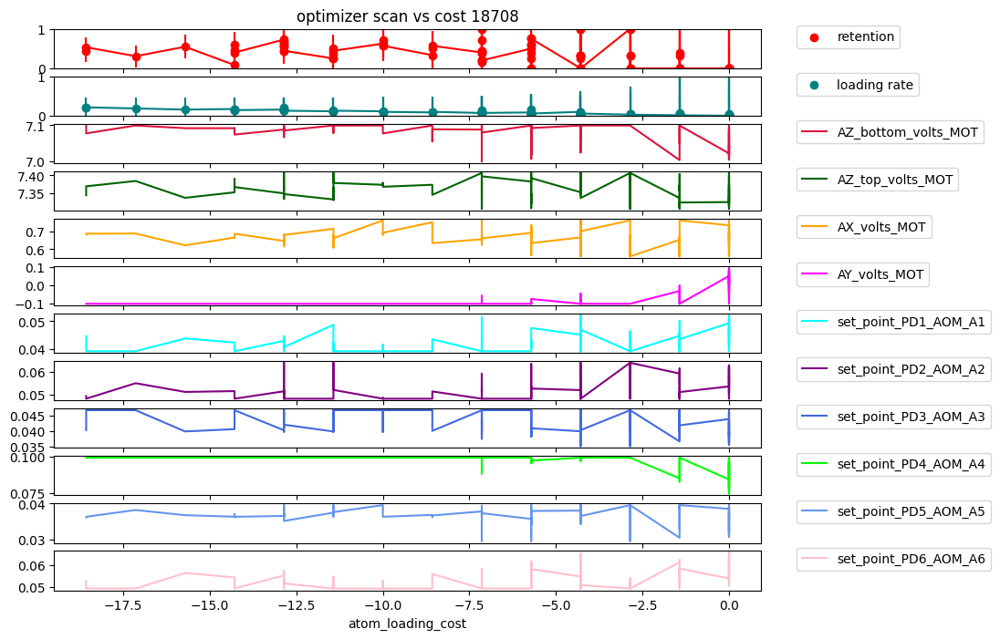

In [38]:
f_idx = 14 # 28% loading
f_idx = 17 

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")

print('loading rate at best cost:',loading_rate[best_cost_iteration])
print('retention at best cost:',retention[best_cost_iteration])

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

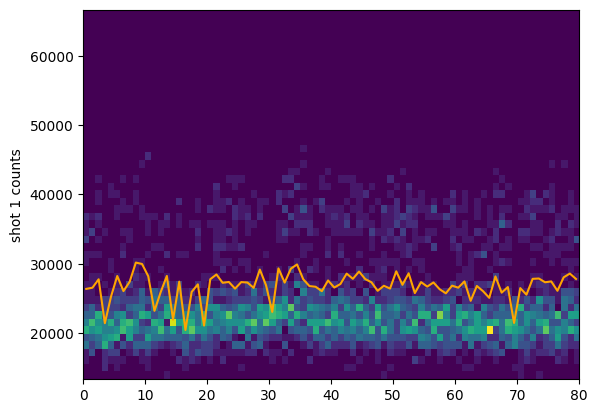

In [33]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.10.30

In [22]:
fnames = get_files_by_criteria(date_filters=[ "2024-10-30"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 12 files
file 0 (...results\2024-10-30\08\000018607-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'", "'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'"] for 'atom_loading_cost'
file 1 (...results\2024-10-30\09\000018613-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'", "'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'"] for 'atom_loading_cost'
file 2 (...results\2024-10-30\11\000018615-GeneralVariableOptimizer_atom_loading_optimized_for_atom_retention.h5) optimized ["'AZ_bottom_volts_PGC'", "'AZ_top_volts_PGC'", "'AX_volts_PGC'", "'AY_volts_PGC'", "'t_P

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False}
[('AZ_bottom_volts_MOT',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_MOT',-0.05*V,0.05*V,'diff'), ('AX_volts_MOT',-0.05*V,0.05*V,'diff'), ('AY_volts_MOT',-0.1*V,0.1*V,'diff'), ('set_point_PD1_AOM_A1',0.9,1.1,'perc'), ('set_point_PD2_AOM_A2',0.9,1.1,'perc'), ('set_point_PD3_AOM_A3',0.9,1.1,'perc'), ('set_point_PD4_AOM_A4',0.9,1.1,'perc'), ('set_point_PD5_AOM_A5',0.9,1.1,'perc'), ('set_point_PD6_AOM_A6',0.9,1.1,'perc')]
best cost (iter. 93): -44.0, intitial cost: -10.0
best 'AZ_bottom_volts_MOT: 6.9750000000000005 (initial:  7.025)
best 'AZ_top_volts_MOT: 7.359 (initial:  7.309)
best 'AX_volts_MOT: 0.515 (initial:  0.465)
best 'AY_volts_MOT: 0.012999999999999989 (initial:  -0.087)
best 'set_point_PD1_AOM_A1: 0.0684 (initial:  0.076)
best 'set_point_PD2_AOM_A2: 0.0517 (initial:  0.047)
best 'set_point_PD3_AOM_A3: 0.0693 (initial:  0.077)
best 'set_point_PD4_AOM_A4: 0.0748 (initial:  0.068)

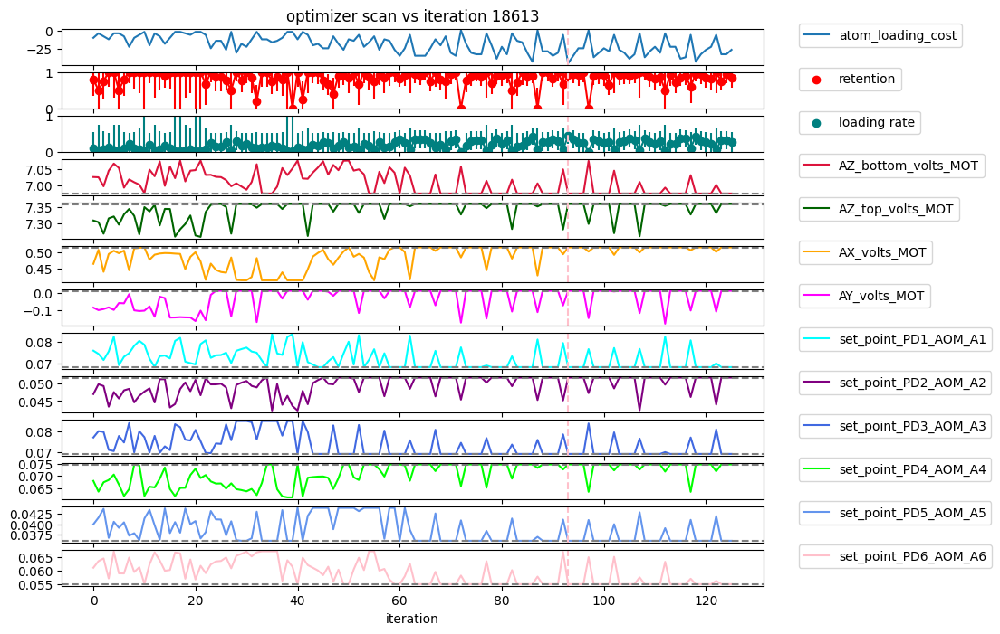

Text(0.5, 0, 'atom_loading_cost')

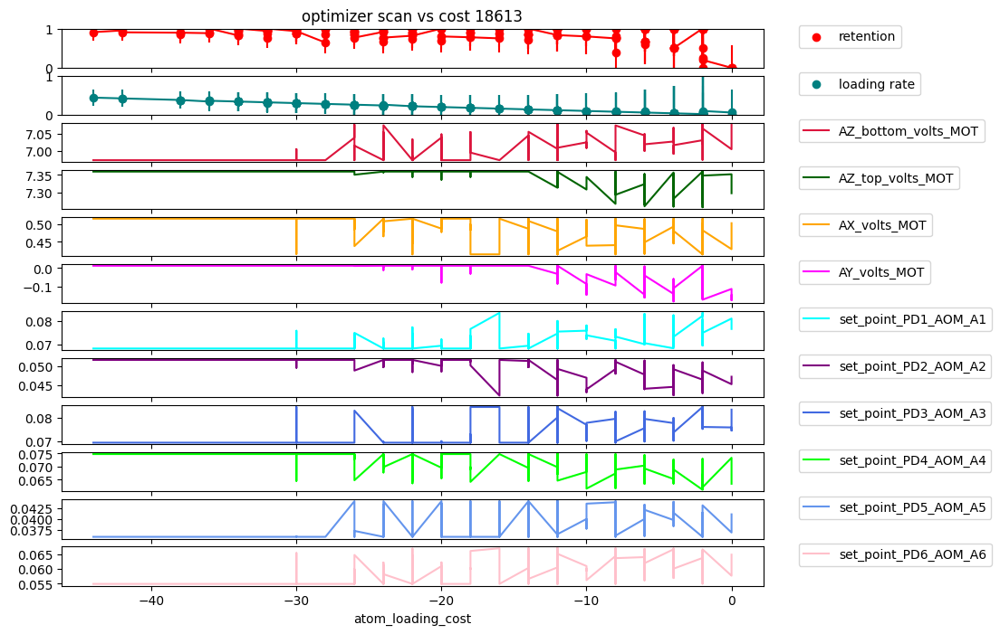

In [27]:
f_idx = 1 # found ~45% loading rate
# f_idx = 4 # retention and loading. not great
# I went back to the settings from 1 and the loading was pretty bad. I wonder if something is drifting. I manually optimized the FORT polarization and now I'm running the AtomLoadingOptimizer again

# f_idx = 8 # only 14 atoms loaded :p
# f_idx = 10 # nothing. 

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

In [30]:
AZ_bottom_volts_PGC, AZ_top_volts_PGC, AX_volts_PGC, AY_volts_PGC

(-0.44083066200286664,
 -0.0829709725917883,
 -0.033067474145826295,
 0.5741556094855849)

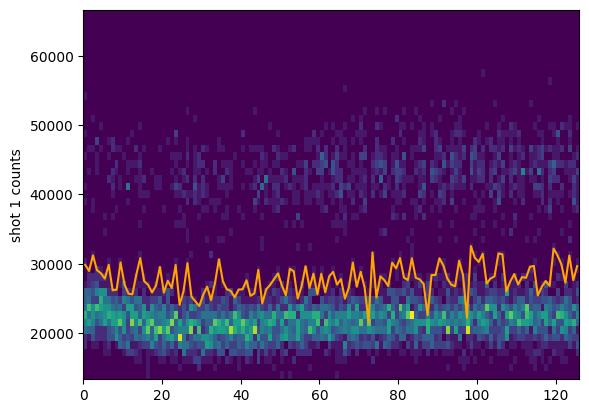

In [28]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.09.27

In [12]:
fnames = get_files_by_criteria(date_filters=[ "2024-09-26", "2024-09-27"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 46 files
file 0 (...results\2024-09-26\11\000017850-GeneralVariableScan.h5) scanned over dummy_variable
file 2 (...results\2024-09-26\11\000017851-GeneralVariableScan.h5) scanned over dummy_variable
file 4 (...results\2024-09-26\11\000017852-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (...results\2024-09-26\11\000017853-GeneralVariableScan.h5) scanned over dummy_variable
file 6 (...results\2024-09-26\11\000017854-GeneralVariableScan.h5) scanned over dummy_variable
file 8 (...results\2024-09-26\11\000017856-GeneralVariableScan.h5) scanned over dummy_variable
file 10 (...results\2024-09-26\11\000017857-GeneralVariableScan.h5) scanned over dummy_variable
file 11 (...results\2024-09-26\16\000017868-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'", "'t_blowaway'", "'p_pumping_repump'"] for 'atom_blowaway_cost'
file 13 (...results\2024-09-26\16\000017870-GeneralVariableOptimizer.h5) optimized ["'AZ_bott

### MOT

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False, 't_FORT_drop': 10*us}
[('AZ_bottom_volts_MOT',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_MOT',-0.05*V,0.05*V,'diff'), ('AX_volts_MOT',-0.1*V,0.1*V,'diff'), ('AY_volts_MOT',-0.1*V,0.1*V,'diff'), ('set_point_PD1_AOM_A1',0.9,1.2,'perc'), ('set_point_PD2_AOM_A2',0.9,1.2,'perc'), ('set_point_PD3_AOM_A3',0.9,1.2,'perc'), ('set_point_PD4_AOM_A4',0.9,1.2,'perc'), ('set_point_PD5_AOM_A5',0.9,1.2,'perc'), ('set_point_PD6_AOM_A6',0.9,1.2,'perc')]
best cost (iter. 46): -30.79251461988304, intitial cost: -25.715200000000006
best 'AZ_bottom_volts_MOT: 7.190727232609615 (initial:  7.2230519166974885)
best 'AZ_top_volts_MOT: 7.663658050813721 (initial:  7.6792733360527174)
best 'AX_volts_MOT: 0.38092550596638886 (initial:  0.3573256589443646)
best 'AY_volts_MOT: -0.08220489018645787 (initial:  -0.09434749144817439)
best 'set_point_PD1_AOM_A1: 0.07351379260388712 (initial:  0.07747682420304304)
best '

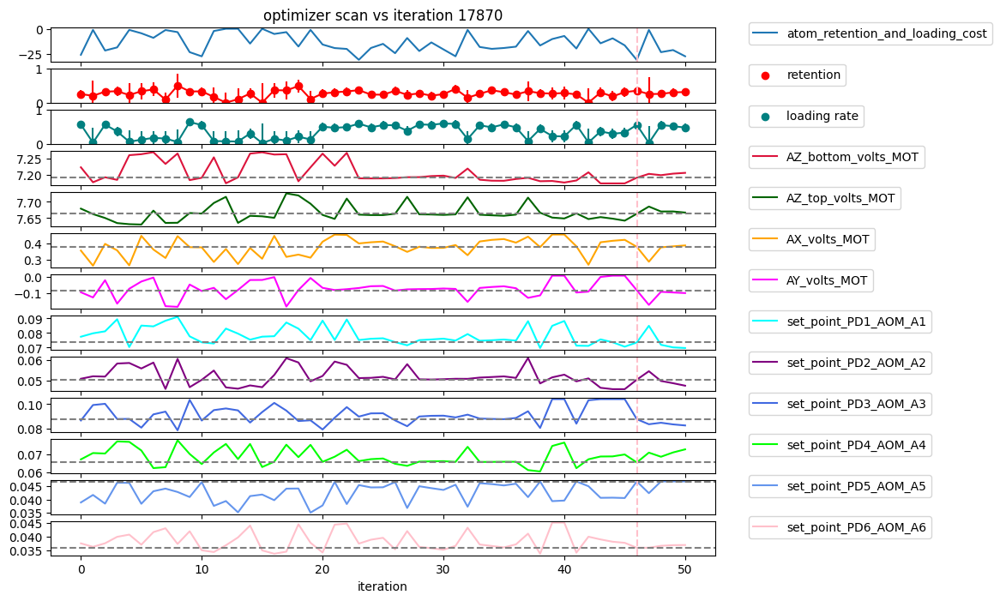

Text(0.5, 0, 'atom_retention_and_loading_cost')

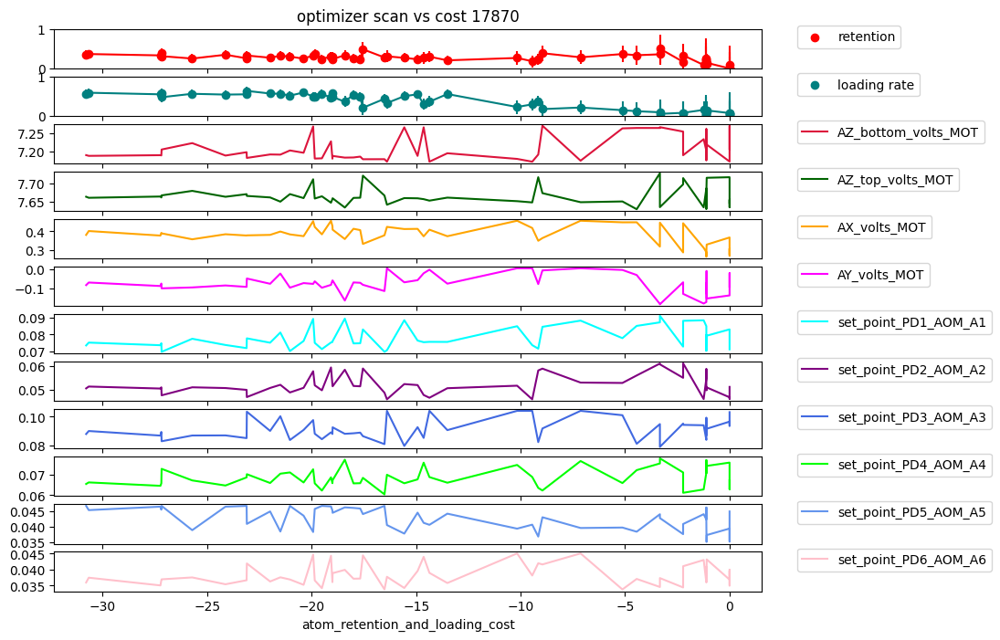

In [20]:
f_idx = 13


# 11 - OP - did not run correctly
# 13 - MOT
# 15 - PGC 

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

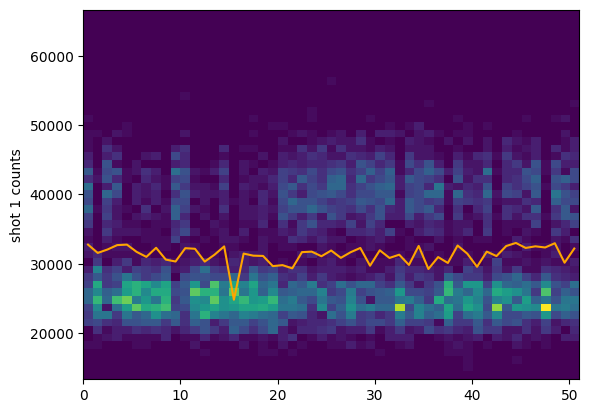

In [10]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### MOT

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False, 't_FORT_drop': 10*us}
[('AZ_bottom_volts_MOT',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_MOT',-0.05*V,0.05*V,'diff'), ('AX_volts_MOT',-0.1*V,0.1*V,'diff'), ('AY_volts_MOT',-0.1*V,0.1*V,'diff'), ('set_point_PD1_AOM_A1',0.9,1.2,'perc'), ('set_point_PD2_AOM_A2',0.9,1.2,'perc'), ('set_point_PD3_AOM_A3',0.9,1.2,'perc'), ('set_point_PD4_AOM_A4',0.9,1.2,'perc'), ('set_point_PD5_AOM_A5',0.9,1.2,'perc'), ('set_point_PD6_AOM_A6',0.9,1.2,'perc')]
best cost (iter. 46): -30.79251461988304, intitial cost: -25.715200000000006
best 'AZ_bottom_volts_MOT: 7.190727232609615 (initial:  7.2230519166974885)
best 'AZ_top_volts_MOT: 7.663658050813721 (initial:  7.6792733360527174)
best 'AX_volts_MOT: 0.38092550596638886 (initial:  0.3573256589443646)
best 'AY_volts_MOT: -0.08220489018645787 (initial:  -0.09434749144817439)
best 'set_point_PD1_AOM_A1: 0.07351379260388712 (initial:  0.07747682420304304)
best '

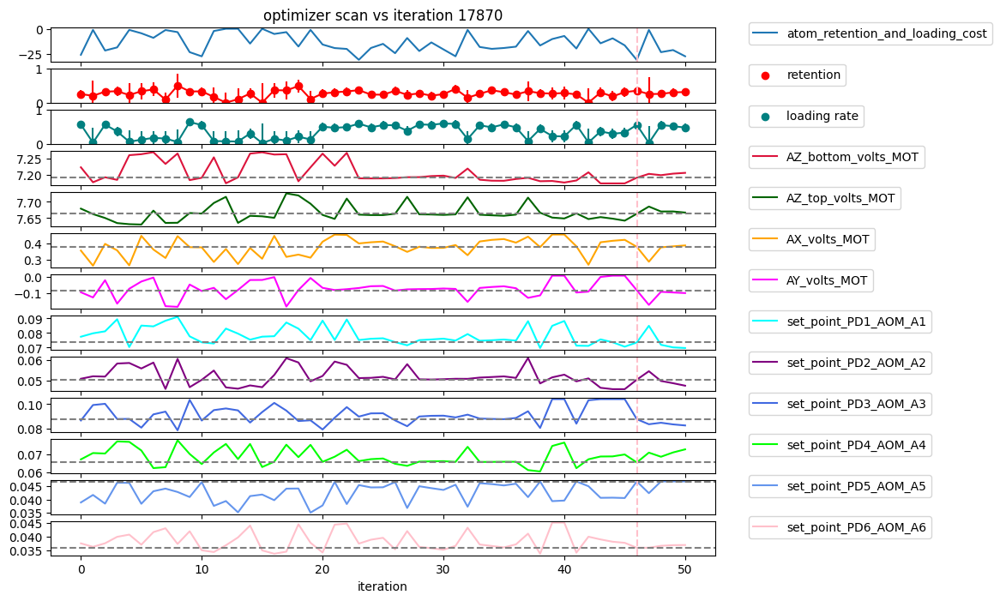

Text(0.5, 0, 'atom_retention_and_loading_cost')

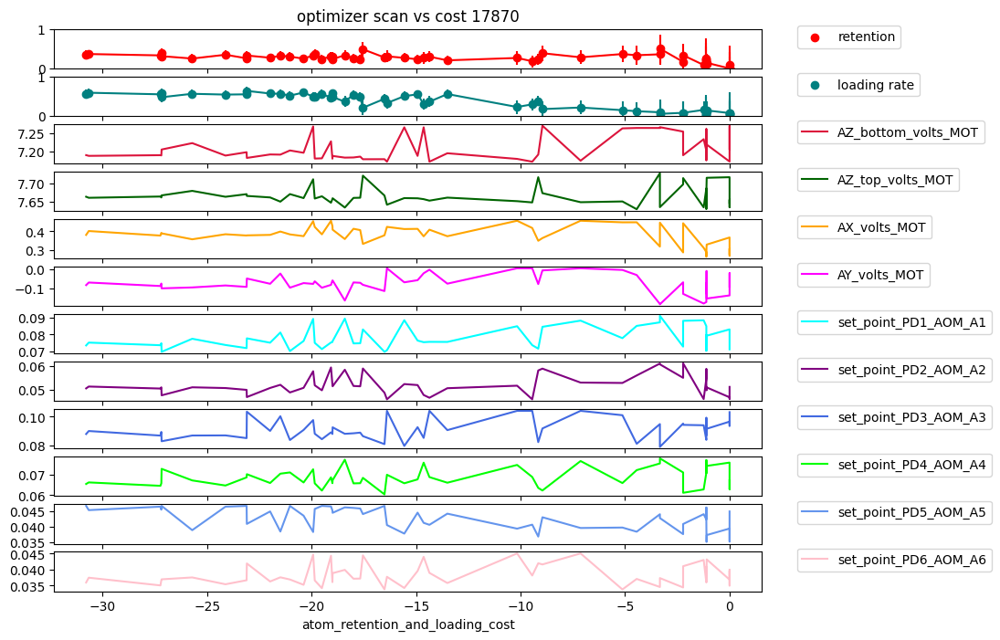

In [20]:
f_idx = 13


# 11 - OP - did not run correctly
# 13 - MOT
# 15 - PGC 

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

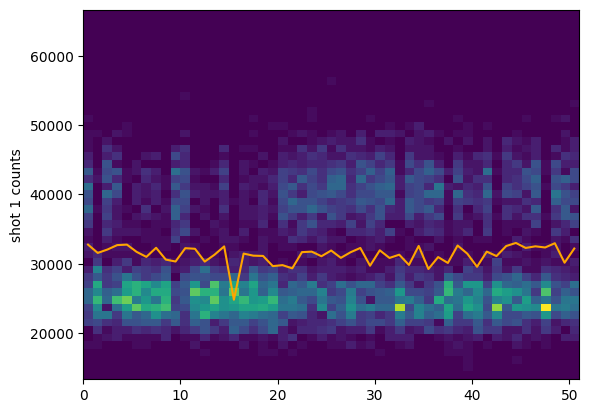

In [10]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### PGC

experiment: atom_loading_experiment
override_ExperimentVariables {'require_atom_loading_to_advance':False, 't_FORT_drop': 10*us}
[('AZ_bottom_volts_PGC',-0.05*V,0.05*V,'diff'), ('AZ_top_volts_PGC',-0.05*V,0.05*V,'diff'), ('AX_volts_PGC',-0.1*V,0.1*V,'diff'), ('AY_volts_PGC',-0.1*V,0.1*V,'diff'), ('set_point_PD1_AOM_A1',0.9,1.2,'perc'), ('set_point_PD2_AOM_A2',0.9,1.2,'perc'), ('set_point_PD3_AOM_A3',0.9,1.2,'perc'), ('set_point_PD4_AOM_A4',0.9,1.2,'perc'), ('set_point_PD5_AOM_A5',0.9,1.2,'perc'), ('set_point_PD6_AOM_A6',0.9,1.2,'perc')]
best cost (iter. 31): -23.438683127572016, intitial cost: -23.268666666666665
best 'AZ_bottom_volts_PGC: -0.44083066200286664 (initial:  -0.4687078403130585)
best 'AZ_top_volts_PGC: -0.0829709725917883 (initial:  -0.1316739495979208)
best 'AX_volts_PGC: -0.033067474145826295 (initial:  -0.1330674741458263)
best 'AY_volts_PGC: 0.5741556094855849 (initial:  0.47415560948558483)
best 'set_point_PD1_AOM_A1: 0.06972914178273874 (initial:  0.07747682420304304

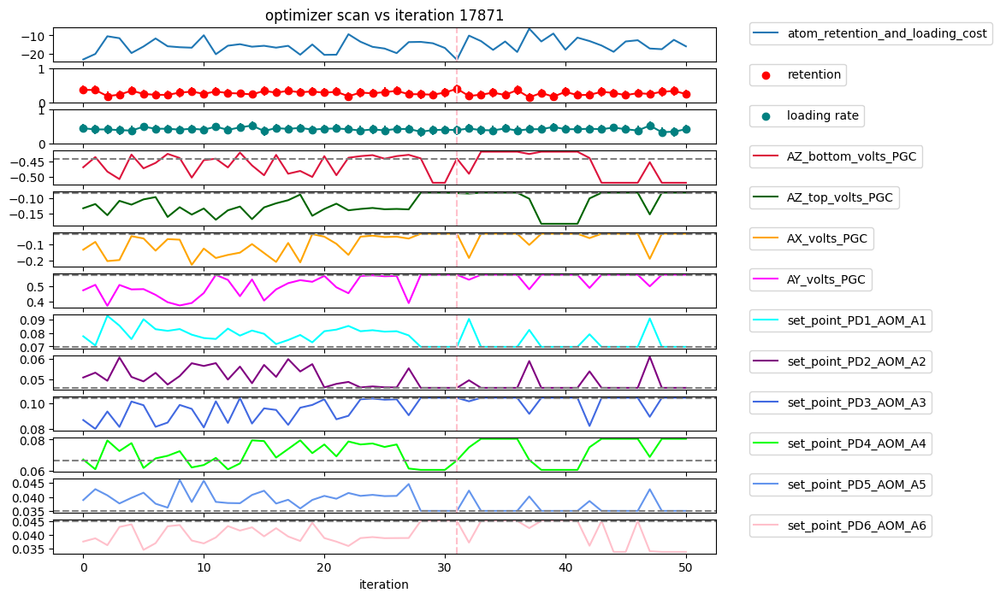

Text(0.5, 0, 'atom_retention_and_loading_cost')

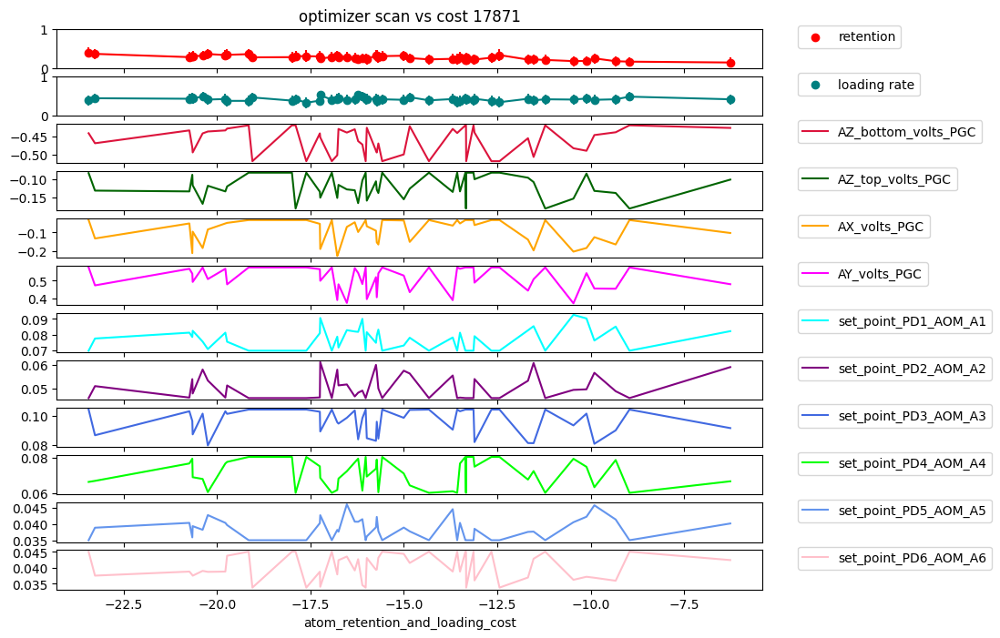

In [21]:
f_idx = 15


# 11 - OP - did not run correctly
# 13 - MOT
# 15 - PGC 

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

print("override_ExperimentVariables", override_ExperimentVariables)
print(variables_and_bounds)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

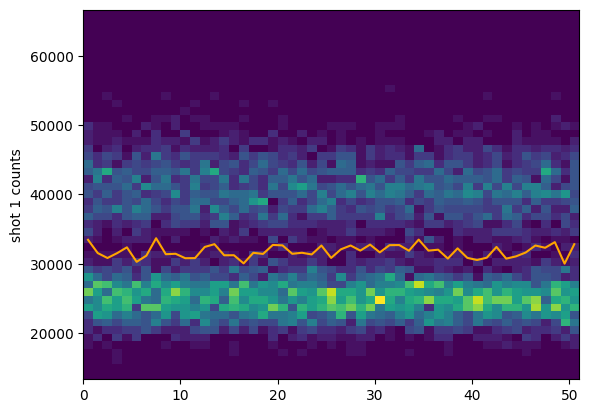

In [22]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
# ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

(array([  31.,  910., 3533., 2076.,  267.,  143.,  281.,  292.,  101.,
          16.]),
 array([14533.33333333, 18333.33333333, 22133.33333333, 25933.33333333,
        29733.33333333, 33533.33333333, 37333.33333333, 41133.33333333,
        44933.33333333, 48733.33333333, 52533.33333333]),
 <BarContainer object of 10 artists>)

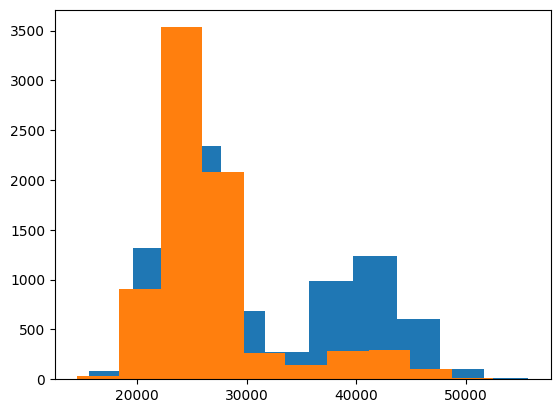

In [26]:
plt.hist(photocounts/0.015)
plt.hist(photocounts2/0.015)

### 2024.09.19

In [4]:
fnames = get_files_by_criteria(date_filters=["2024-09-19", "2024-09-26"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 70 files
file 0 (...results\2024-09-19\10\000017576-GeneralVariableScan.h5) scanned over t_FORT_drop
file 1 (...results\2024-09-19\10\000017577-GeneralVariableScan.h5) scanned over t_FORT_drop
file 3 (...results\2024-09-19\10\000017578-GeneralVariableScan.h5) scanned over dummy_variable
file 4 (...results\2024-09-19\10\000017579-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (...results\2024-09-19\11\000017580-GeneralVariableScan.h5) scanned over dummy_variable
file 7 (...results\2024-09-19\11\000017581-GeneralVariableScan.h5) scanned over dummy_variable
file 8 (...results\2024-09-19\11\000017582-GeneralVariableScan.h5) scanned over dummy_variable
file 9 (...results\2024-09-19\11\000017583-GeneralVariableScan.h5) scanned over dummy_variable
file 10 (...results\2024-09-19\12\000017602-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_retention_and_loading_cost'
file 12 (...results\2024-0

### optimizing atom loading and retention after a FORT drop

experiment: atom_loading_experiment
best cost (iter. 13): -34.119658119658126, intitial cost: -19.991228070175435
best 'AZ_bottom_volts_MOT: 7.411271513535303 (initial:  7.452)
best 'AZ_top_volts_MOT: 7.841908426074271 (initial:  7.887)
best 'AX_volts_MOT: 0.4391005853833061 (initial:  0.47)
best 'AY_volts_MOT: -0.15634392939136374 (initial:  -0.153)


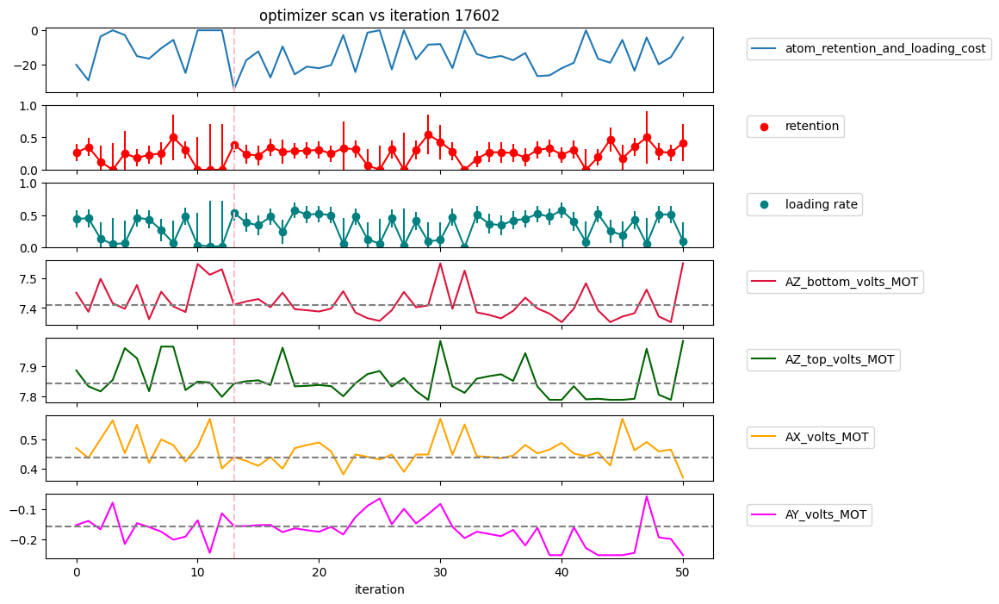

Text(0.5, 0, 'atom_retention_and_loading_cost')

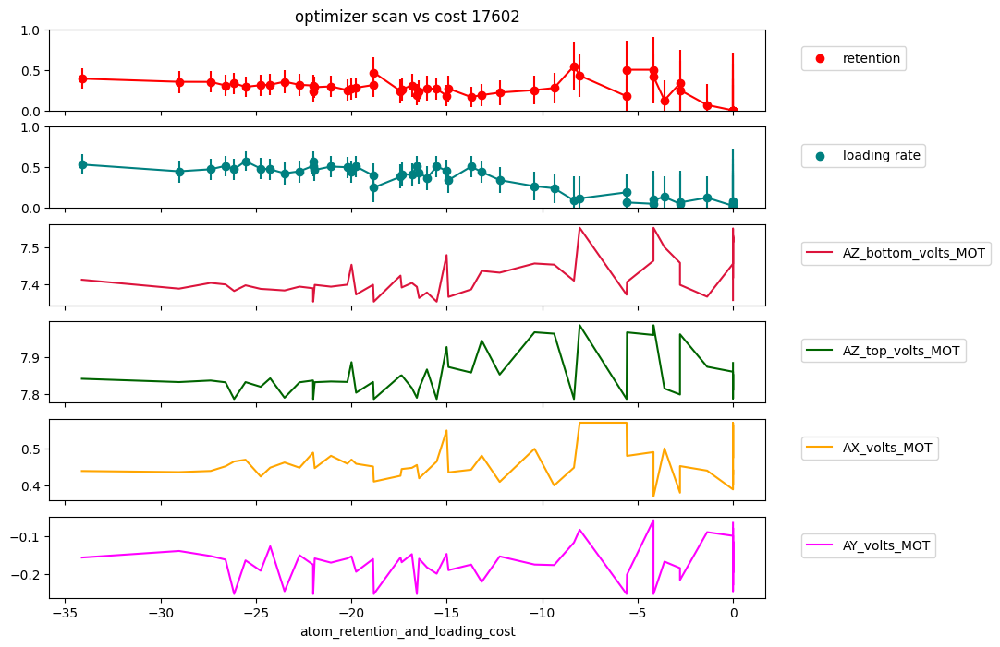

In [60]:
f_idx = 10

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

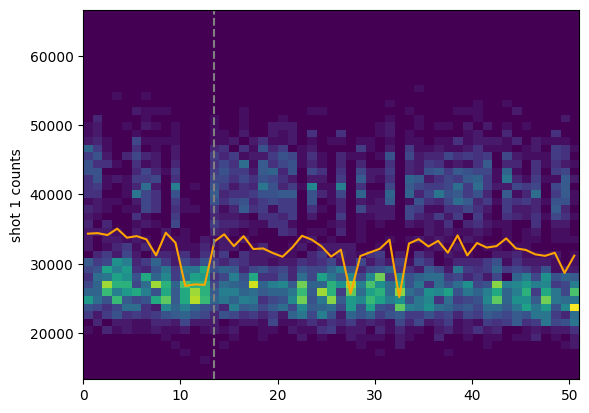

In [78]:
first_shot_hists = [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                    for i in range(iterations)]

thresholds = [threshold_otsu(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot) for i in range(iterations)]

fig,ax = plt.subplots(sharex=True)
cax=ax.imshow(np.array(first_shot_hists).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.set_aspect('auto')
ax.plot(np.array(range(len(thresholds)))+0.5, thresholds,color='orange')
ax.axvline(13.5,color='gray',ls='--')
# ax.axhline(cutoff1/t_SPCM_first_shot,color='red')

### 2024.09.18

In [58]:
fnames = get_files_by_criteria(date_filters=["2024-09-18"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 83 files
file 0 (...results\2024-09-18\09\000017461-GeneralVariableScan.h5) scanned over p_pumping_repump
file 2 (...results\2024-09-18\09\000017462-GeneralVariableScan.h5) scanned over p_pumping_repump
file 3 (...results\2024-09-18\09\000017463-GeneralVariableScan.h5) scanned over p_pumping_repump
file 4 (...results\2024-09-18\10\000017464-GeneralVariableScan.h5) scanned over p_pumping_repump
file 6 (...results\2024-09-18\11\000017489-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_retention_and_loading_cost'
file 8 (...results\2024-09-18\13\000017491-GeneralVariableScan.h5) scanned over t_FORT_drop
file 10 (...results\2024-09-18\14\000017502-GeneralVariableScan.h5) scanned over dummy_variable
file 11 (...results\2024-09-18\14\000017503-GeneralVariableScan.h5) scanned over dummy_variable
file 12 (...results\2024-09-18\14\000017504-GeneralVariableScan.h5) scanned over dummy_variable
file 13 (...r

In [ ]:
't_SPCM_second_shot':5*ms

### optimizing atom loading and retention after a FORT drop

experiment: atom_loading_experiment
best cost (iter. 33): -27.777777777777782, intitial cost: -16.666666666666668
best 'AZ_bottom_volts_MOT: 7.418699661409542 (initial:  7.368699661409543)
best 'AZ_top_volts_MOT: 7.93770793382067 (initial:  7.912718817889943)
best 'AX_volts_MOT: 0.4612197178821614 (initial:  0.49309694675233945)
best 'AY_volts_MOT: -0.2192352494165422 (initial:  -0.28083838750731027)


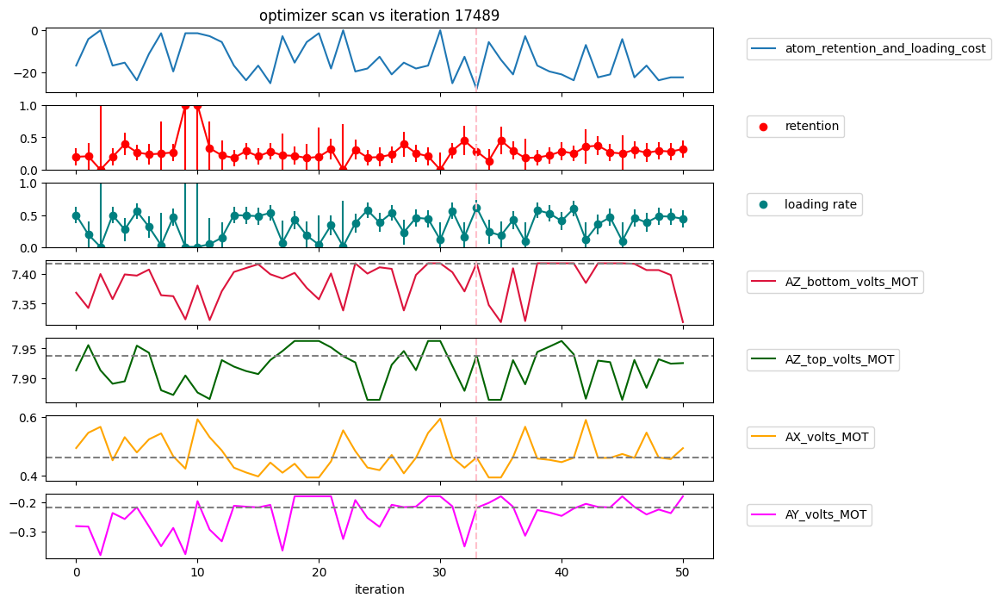

Text(0.5, 0, 'atom_retention_and_loading_cost')

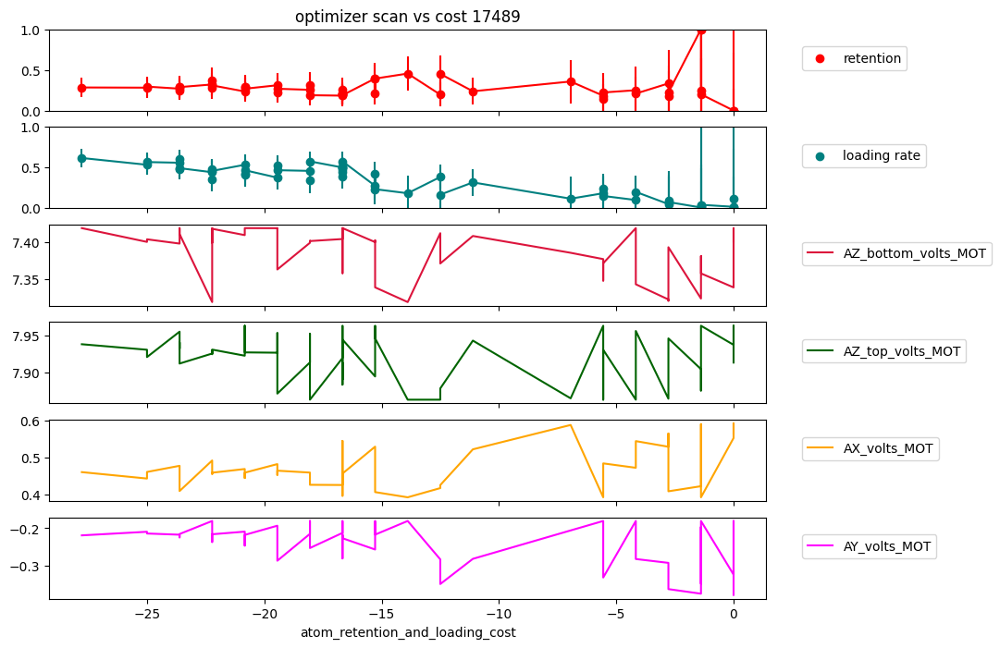

In [56]:
f_idx = 6
f_idx = 

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

### 2024.09.17

In [54]:
fnames = get_files_by_criteria(date_filters=["2024-09-16", "2024-09-17"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 59 files
file 0 (...results\2024-09-16\09\000017409-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (...results\2024-09-16\09\000017411-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 4 (...results\2024-09-16\10\000017413-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_blowaway_cost'
file 5 (...results\2024-09-16\10\000017414-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_blowaway_cost'
file 6 (...results\2024-09-16\10\000017416-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 8 (...results\2024-09-16\10\000017418-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_blowaway_cost'
file 9 (...results\2024-09-16\11\000017420-Gene

### optimizing OP shims

experiment: microwave_Rabi_experiment
best cost (iter. 22): -93.42105263157895, intitial cost: -67.85714285714286
best 'AZ_bottom_volts_OP: -0.43173850914499845 (initial:  -0.40691846107787943)
best 'AZ_top_volts_OP: -0.13069118814332648 (initial:  -0.15890742715001432)
best 'AX_volts_OP: -0.055103104744432904 (initial:  -0.029661297796041708)
best 'AY_volts_OP: 3.088921236209193 (initial:  3.1657751034336967)


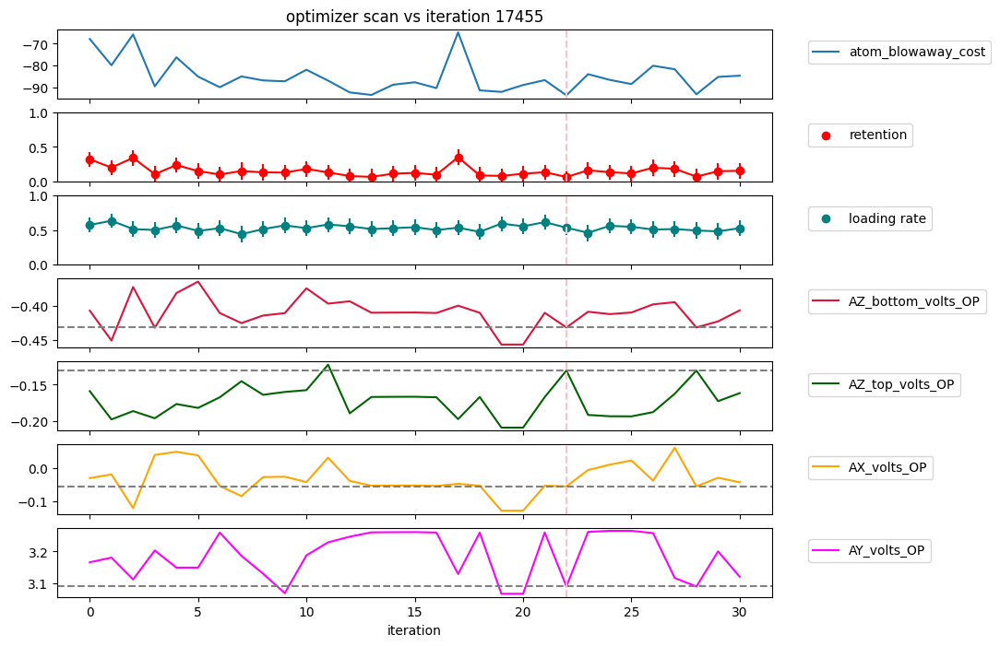

Text(0.5, 0, 'atom_blowaway_cost')

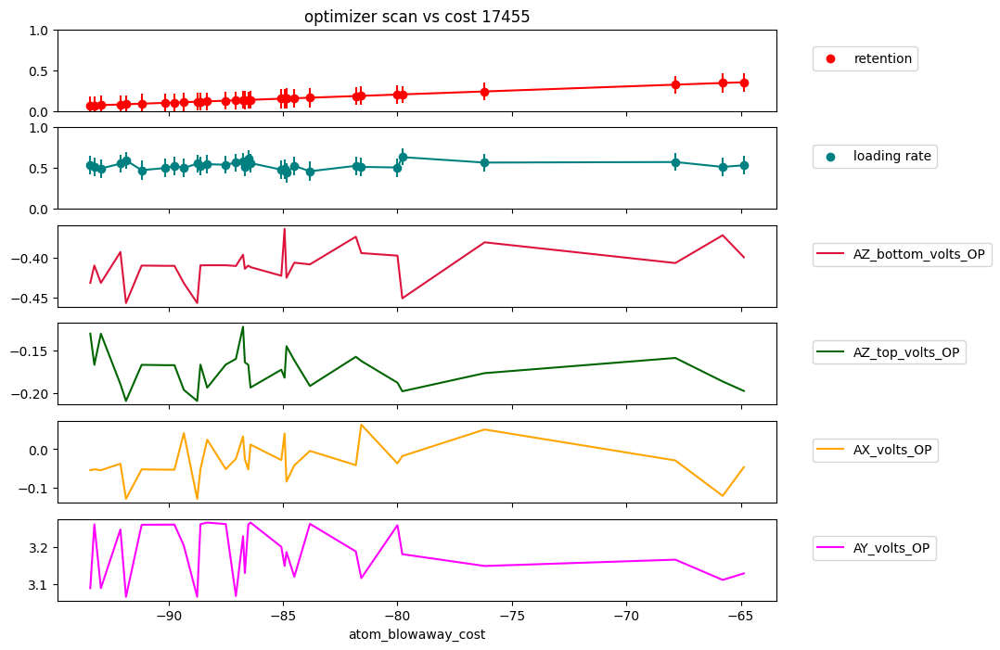

In [53]:
# f_idx = 30
# f_idx = 44
f_idx = 49

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

### 2024.09.13

In [37]:
fnames = get_files_by_criteria(date_filters=["2024-09-13"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 19 files
file 0 (...results\2024-09-13\09\000017365-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2024-09-13\09\000017366-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 4 (...results\2024-09-13\10\000017367-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2024-09-13\10\000017368-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 8 (...results\2024-09-13\11\000017369-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (...results\2024-09-13\11\000017370-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 12 (...results\2024-09-13\12\000017373-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 14 (...results\2024-09-13\13\000017377-GeneralVariableOptimizer_atom_loading_optimized_for_atom_retention.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_cost'
file 15 (...results\2024-09-13\14\000017378-GeneralVariableOptimizer_

### optimizing RO and PGG shims with FORT drop

experiment: atom_loading_experiment
best cost (iter. 2): -44.11764705882353, intitial cost: -22.22222222222222
best 'AZ_bottom_volts_RO: -0.509918126553013 (initial:  -0.5)
best 'AZ_top_volts_RO: -0.06459590416990468 (initial:  -0.1)
best 'AX_volts_RO: -0.20376977073393132 (initial:  -0.113)
best 'AY_volts_RO: 0.5204542748512576 (initial:  0.5)


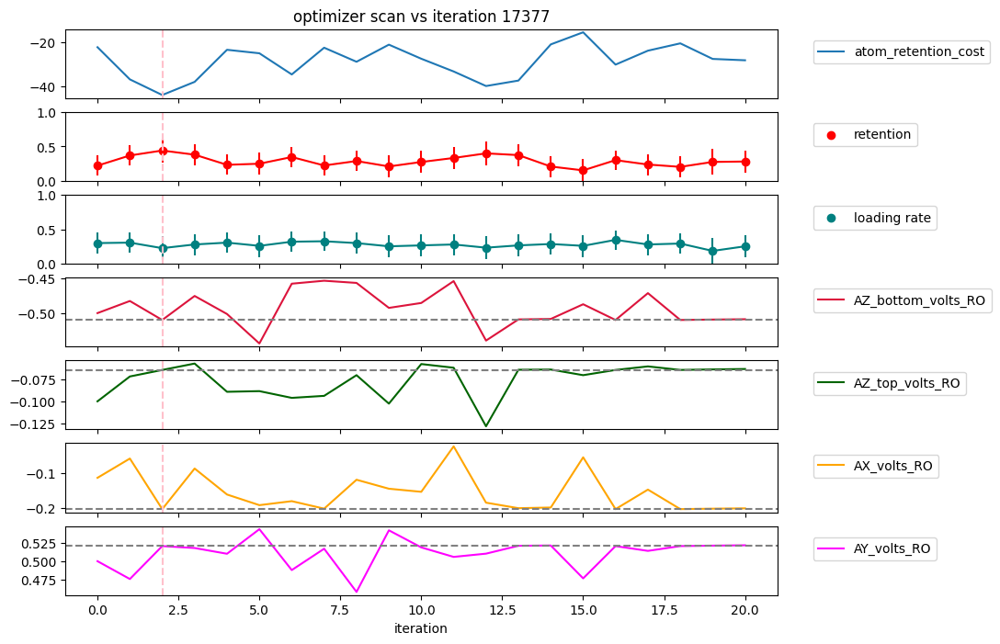

Text(0.5, 0, 'atom_retention_cost')

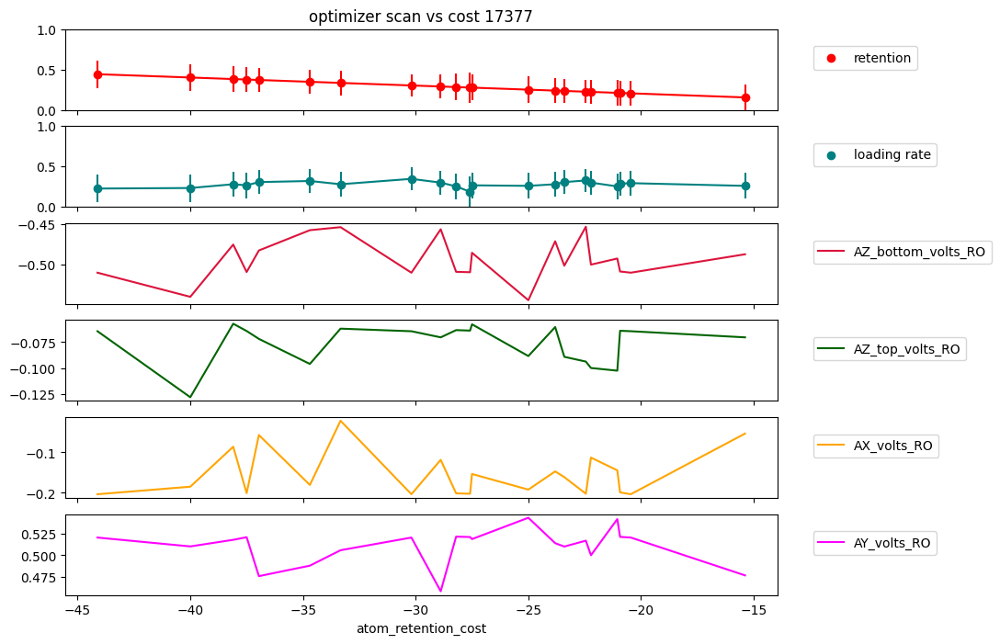

In [39]:
f_idx = 14
# f_idx = 15

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

## 2024.09.12

In [42]:
fnames = get_files_by_criteria(date_filters=["2024-09-12"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 27 files
file 0 (...results\2024-09-12\09\000017334-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2024-09-12\10\000017335-GeneralVariableScan.h5) scanned over blowaway_light_off
file 4 (...results\2024-09-12\10\000017336-GeneralVariableScan.h5) scanned over t_blowaway
file 6 (...results\2024-09-12\10\000017337-GeneralVariableScan.h5) scanned over t_blowaway
file 8 (...results\2024-09-12\11\000017340-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (...results\2024-09-12\11\000017344-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 12 (...results\2024-09-12\13\000017346-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 14 (...results\2024-09-12\13\000017348-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_blowaway_cost'
file 15 (...results\2024-09-12\13\000017349-GeneralVariableOptimizer_microwave_R

### optimizing OP shims - new record! only ~~6%~~ 2% of atom survive!

experiment: microwave_Rabi_experiment
cost:  atom_blowaway_cost
override:  {'require_atom_loading_to_advance':False,'t_microwave_pulse':self.t_pi_microwave_pulse}
best cost (iter. 3): -98.0, intitial cost: -85.96491228070175
best 'AZ_bottom_volts_OP: -0.49544049954677005 (initial:  -0.45041306503473405)
best 'AZ_top_volts_OP: -0.21709276188335258 (initial:  -0.2026709328313019)
best 'AX_volts_OP: 0.06032712893095049 (initial:  0.01809790249078641)
best 'AY_volts_OP: 3.1516056135819466 (initial:  3.163761298488528)


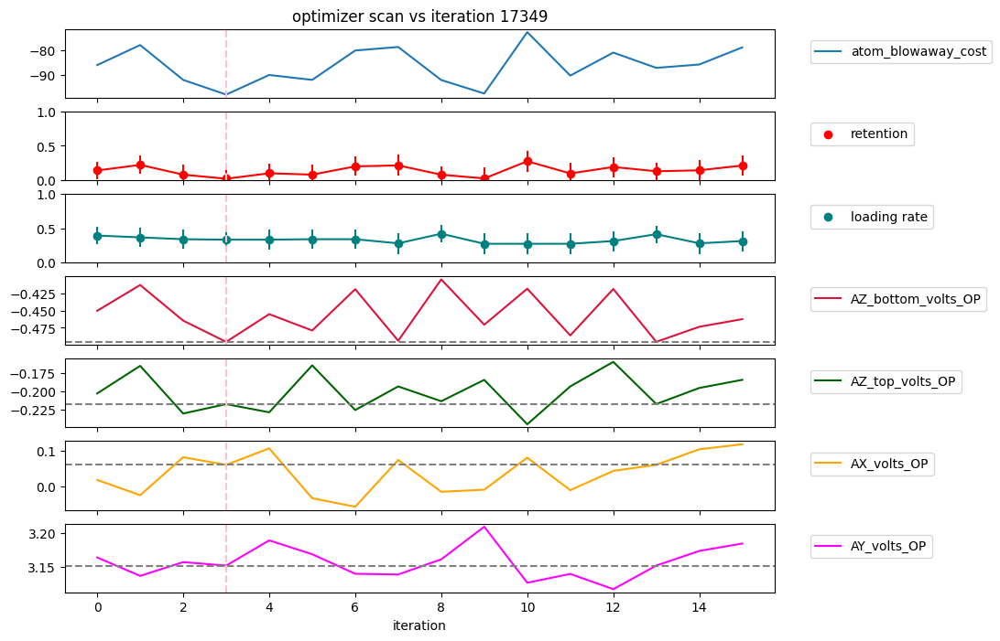

Text(0.5, 0, 'atom_blowaway_cost')

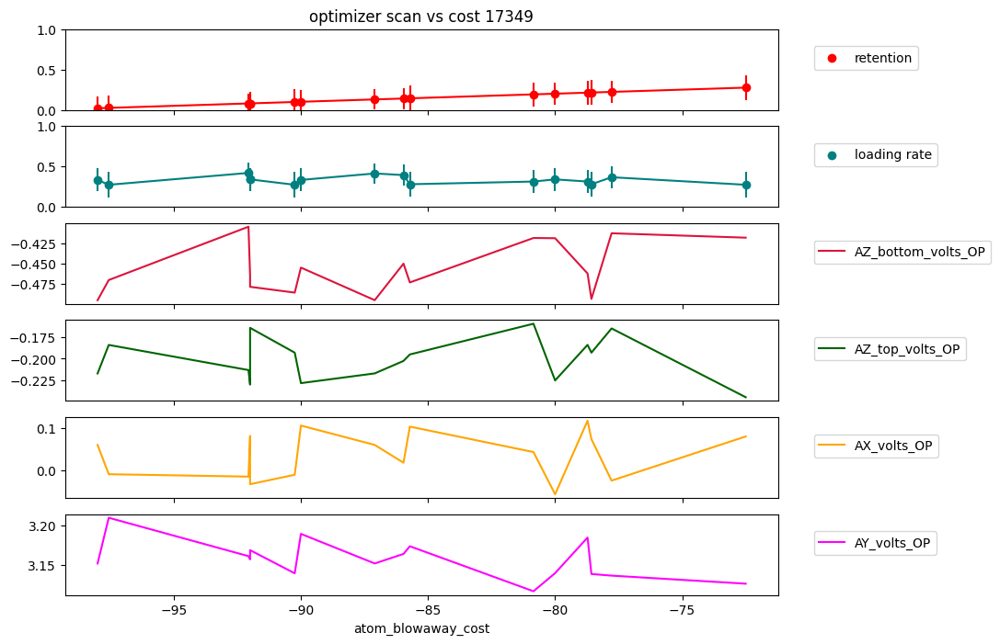

In [45]:
f_idx = 15 # new record! only 2% of atom survive!

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
print("cost: ", cost_function)
print("override: ", override_ExperimentVariables)
iterations = len(optimizer_var0)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

### 2024.09.11

In [31]:
fnames = get_files_by_criteria(date_filters=["2024-09-11"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 24 files
file 0 (...results\2024-09-11\10\000017314-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (...results\2024-09-11\10\000017315-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 4 (...results\2024-09-11\10\000017316-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 6 (...results\2024-09-11\11\000017317-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 8 (...results\2024-09-11\11\000017320-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 10 (...results\2024-09-11\12\000017321-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 12 (...results\2024-09-11\13\000017323-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 14 (...results\2024-09-11\14\000017327-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_blowaway_cost'
file 15 (...results\2024-09-11\14\000017329-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h

### optimizing OP shims - new record! only ~~14%~~ 6% of atom survive!

experiment: microwave_Rabi_experiment
best cost (iter. 25): -93.87755102040816, intitial cost: -75.0
best 'AZ_bottom_volts_OP: -0.44814646944002073 (initial:  -0.3981464694400208)
best 'AZ_top_volts_OP: -0.255 (initial:  -0.305)
best 'AX_volts_OP: -0.10000000000000002 (initial:  -0.2)
best 'AY_volts_OP: 3.0999999999999996 (initial:  3.05)


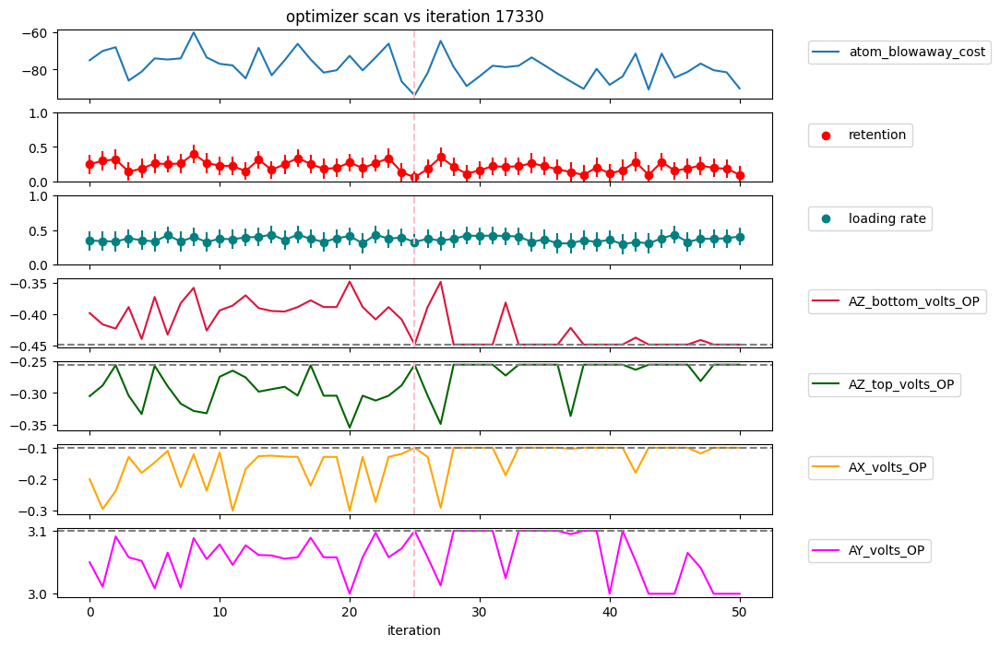

Text(0.5, 0, 'atom_blowaway_cost')

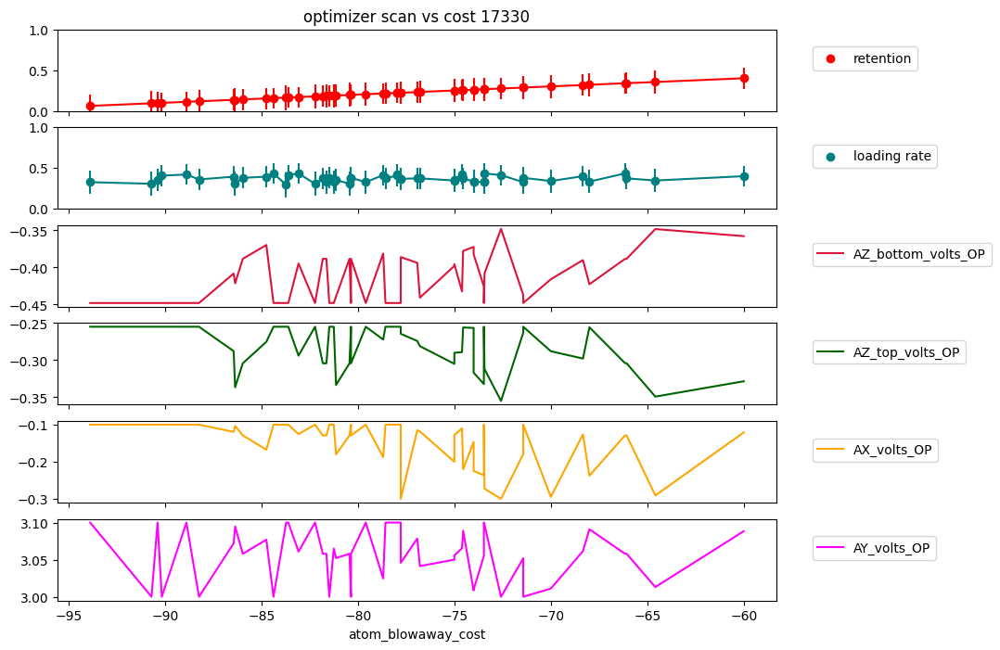

In [30]:
f_idx = 15 # new record! only 14% of atom survive!
f_idx = 16 # new record! only 6% of atom survive!

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

### 2024.09.10

In [16]:
fnames = get_files_by_criteria(date_filters=["2024-09-10"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]

                # print()
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 4 files
file 0 (...results\2024-09-10\14\000017289-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (...results\2024-09-10\14\000017291-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 3 (...results\2024-09-10\15\000017293-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading_with_otsu_threshold.h5) optimized ["'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'", "'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_with_otsu_threshold_cost'
skipped 1 redundant files
1 scan_variables over 2 variable scans


### optimizing atom loading with 200 ms MOT loading

experiment: atom_loading_experiment
best cost (iter. 8): -31.25, intitial cost: -18.75
best 'set_point_PD1_AOM_A1: 0.07954020049790785 (initial:  0.082)
best 'set_point_PD2_AOM_A2: 0.04675173799756789 (initial:  0.049)
best 'set_point_PD3_AOM_A3: 0.07050431782261461 (initial:  0.071)
best 'set_point_PD4_AOM_A4: 0.07808454174421443 (initial:  0.076)
best 'set_point_PD5_AOM_A5: 0.04487426499169295 (initial:  0.04698539423429515)
best 'set_point_PD6_AOM_A6: 0.03870599515742355 (initial:  0.038)
best 'AZ_bottom_volts_MOT: 7.3945779963885805 (initial:  7.424)
best 'AZ_top_volts_MOT: 7.828481610330753 (initial:  7.857)
best 'AX_volts_MOT: 0.5316341443874342 (initial:  0.569)
best 'AY_volts_MOT: -0.25208513212028755 (initial:  -0.253)


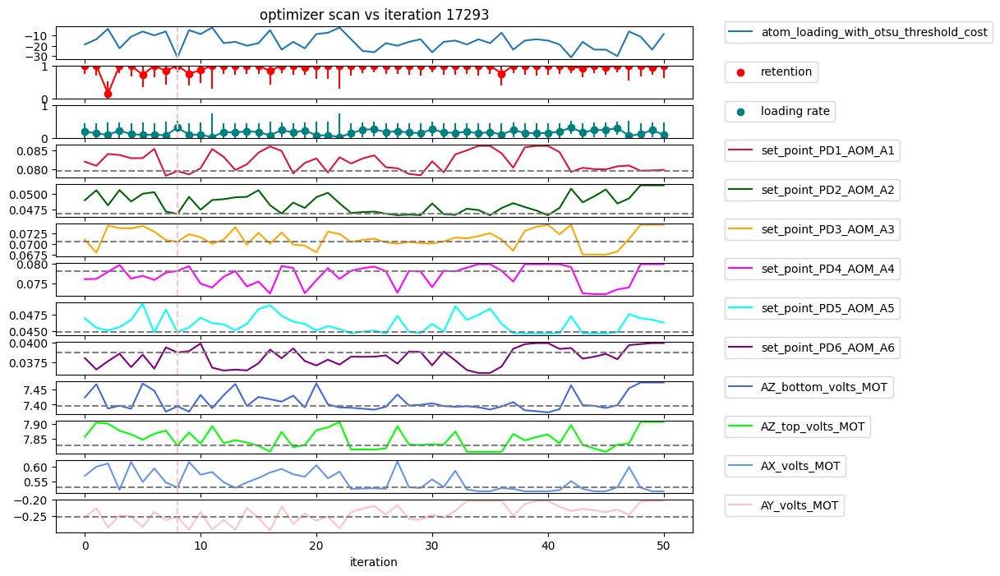

Text(0.5, 0, 'atom_loading_with_otsu_threshold_cost')

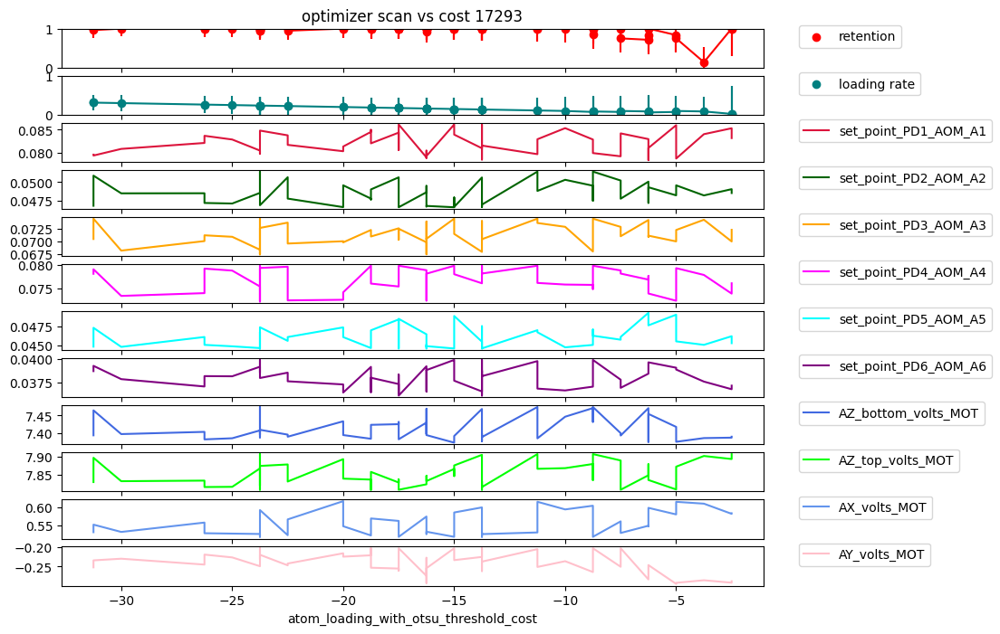

In [26]:
f_idx = 3

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

best_cost_iteration = np.argmin(cost)

print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}, intitial cost: {cost[0]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration]} (initial:  {locals()[f'optimizer_var{i}'][0]})")
    
colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)
    ax.axhline(locals()[f'optimizer_var{i}'][best_cost_iteration], color='gray', ls='--')
ax.set_xlabel("iteration")

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][sorted_idcs], label=str(optimizer_vars_dataset[i])[2:-1], color=colors[i])
    ax.legend(loc=loc)

ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

### 2024.09.09

In [5]:
fnames = get_files_by_criteria(date_filters=["2024-09-09"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]

                # print()
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 15 files
file 0 (...results\2024-09-09\11\000017197-GeneralVariableOptimizer.h5) optimized ["'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'", "'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 1 (...results\2024-09-09\11\000017198-GeneralVariableOptimizer.h5) optimized ["'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'", "'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 2 (...results\2024-09-09\12\000017199-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'", "'AZ_bottom_vo

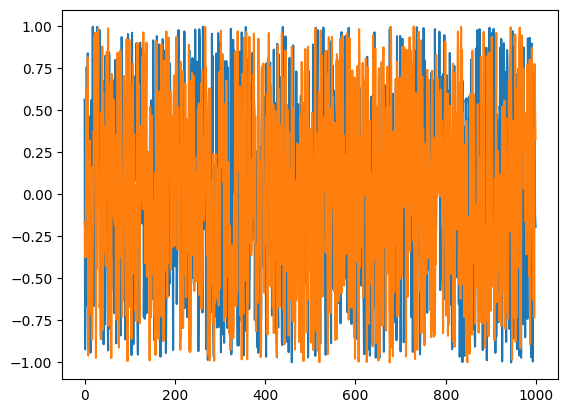

In [6]:
default = 0.67
minperc = 0.82
maxperc = 1.05
minb = minperc*default
maxb = maxperc*default
data = ((maxperc - minperc)*np.random.rand(1000)+minperc)*default
data[0] = default

b = -(maxb + minb)/(maxb - minb)
m = -(1+b)/minb

data_normed = data*m + b
plt.plot(data_normed)

mindiff = -0.5
maxdiff = 0.7
minb = default + mindiff
maxb = default + maxdiff
data = ((maxdiff - mindiff)*np.random.rand(1000)+mindiff) + default
data[0] = default

b = -(maxb + minb)/(maxb - minb)
m = -(1+b)/minb

data_normed = data*m + b
plt.plot(data_normed)

In [7]:
minb*m + b, maxb*m + b

(-1.0, 0.9999999999999987)

### optimizing atom loading with 200 ms MOT loading

experiment: atom_loading_experiment


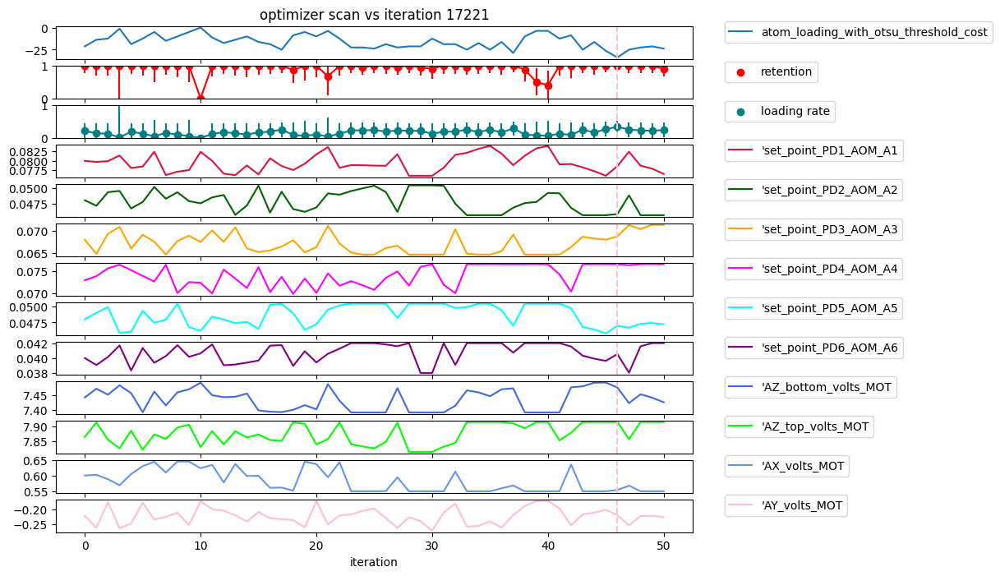

best cost (iter. 46): -33.75
best 'set_point_PD1_AOM_A1: 0.08243271580763155
best 'set_point_PD2_AOM_A2: 0.04878999000170045
best 'set_point_PD3_AOM_A3: 0.07132261738079362
best 'set_point_PD4_AOM_A4: 0.07642602218674714
best 'set_point_PD5_AOM_A5: 0.04670271511372669
best 'set_point_PD6_AOM_A6: 0.03803164545281446
best 'AZ_bottom_volts_MOT: 7.423646104301587
best 'AZ_top_volts_MOT: 7.857137243578512
best 'AX_volts_MOT: 0.5687724932280203
best 'AY_volts_MOT: -0.25348168759052153


IndexError: index 50 is out of bounds for axis 0 with size 50

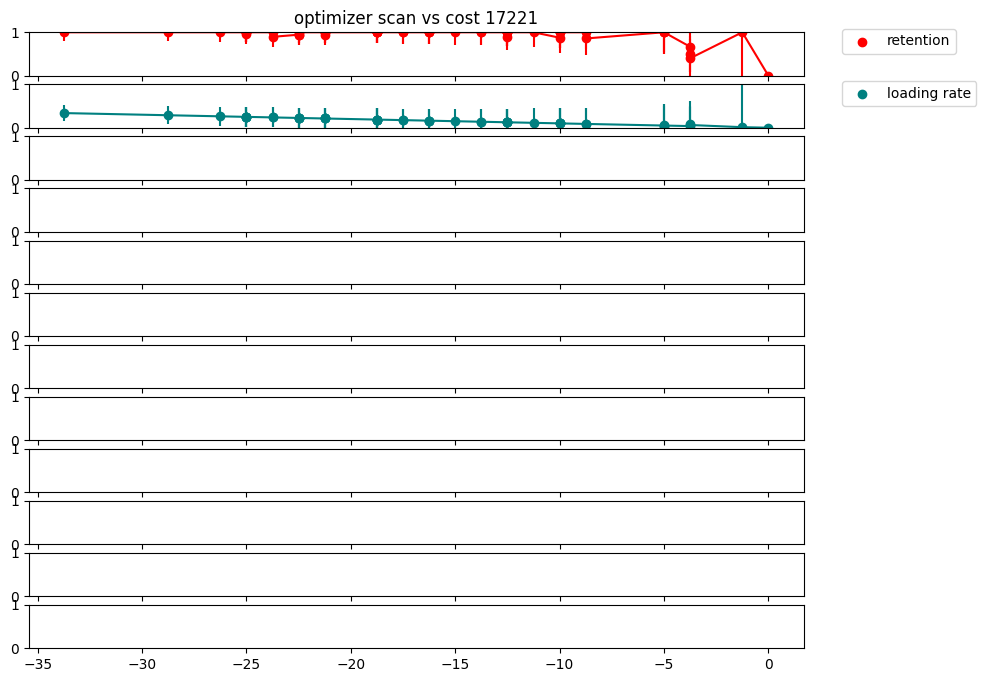

In [15]:
f_idx = 11

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0)

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    cost = compute_cost(retention, loading, cost_function)
    
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        pass # not all cost functions depend on retention

else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        # not all cost functions depend on retention so we still need to compute it
        retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1=single_atom_counts_per_s*t_SPCM_first_shot,otsu=True)
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+3, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)
ax = axes[2]
ax.plot(range(iterations),loading_rate, color='teal')
ax.scatter(range(iterations), loading_rate, label='loading rate', color='teal')
ax.errorbar(range(iterations), loading_rate, errs, ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

colors = ['crimson','darkgreen','orange','magenta','cyan','purple','royalblue','lime','cornflowerblue','pink']
for i, ax in enumerate(axes[3:]):
    ax.plot(locals()[f'optimizer_var{i}'], label=str(optimizer_vars_dataset[i])[1:-1], color=colors[i])
    ax.legend(loc=loc)
ax.set_xlabel("iteration")

best_cost_iteration = np.argmin(cost)

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()
print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+2, sharex=True, figsize=(10,8))
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

ax = axes[1]
ax.plot(cost[sorted_idcs],loading_rate[sorted_idcs], color='teal')
ax.scatter(cost[sorted_idcs], loading_rate[sorted_idcs], label='loading rate', color='teal')
ax.errorbar(cost[sorted_idcs], loading_rate[sorted_idcs], errs[sorted_idcs], ls='none', color='teal')
ax.set_ylim(0,1)
ax.legend(loc=loc)

for i, ax in enumerate(axes[2:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][1:][sorted_idcs], label=str(optimizer_vars_dataset[i])[1:-1], color=colors[i])
    ax.legend(loc=loc)
ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

In [14]:
len(cost), len(loading_rate), np.argmax(loading_rate), np.argmin(cost)

(50, 50, 46, 45)

### 2024.08.30

In [53]:
fnames = get_files_by_criteria(date_filters=["2024-08-30"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]

                # print()
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 2 files
file 0 (...results\2024-08-30\09\000017039-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'"] for 'atom_blowaway_cost'
file 1 (...results\2024-08-30\11\000017041-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
skipped 0 redundant files
1 scan_variables over 1 variable scans


### optimizing optical pumping with OP shims - data from 8.30

experiment: microwave_Rabi_experiment


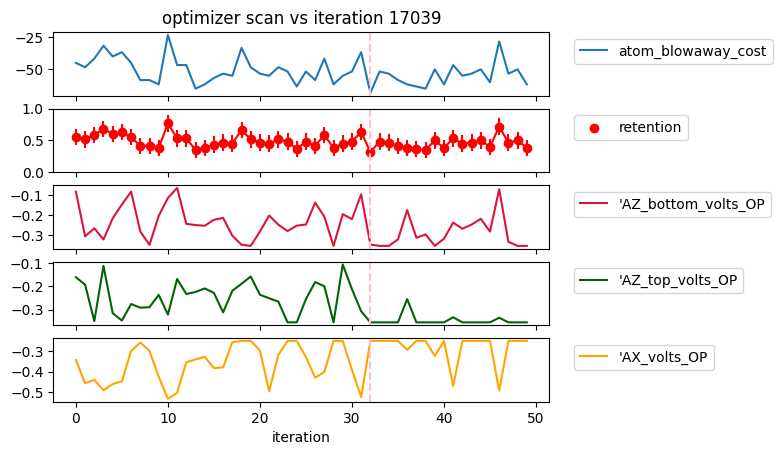

best cost (iter. 32): -68.33333333333333
best 'AZ_bottom_volts_OP: -0.3481464694400208
best 'AZ_top_volts_OP: -0.355
best 'AX_volts_OP: -0.25


Text(0.5, 0, 'atom_blowaway_cost')

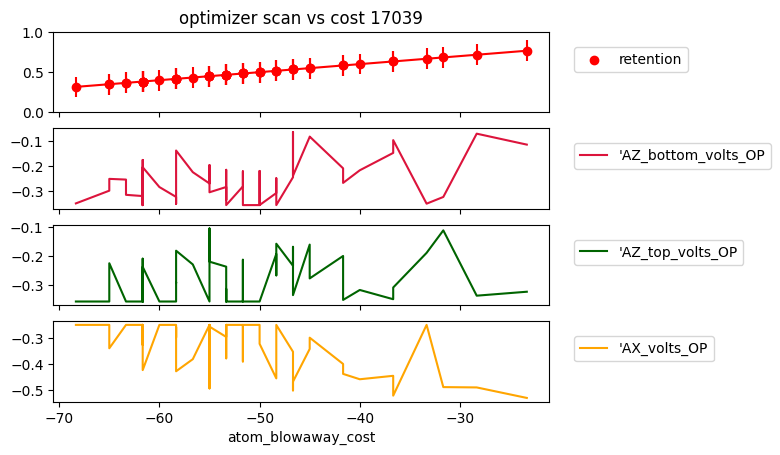

In [57]:
f_idx = 0

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0[1:])

cost = cost[1:] # the first entry is 0, which makes len(cost) == iterations+1

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    if cost_function == 'atom_blowaway_cost':
        cost = -100*(1-retention)
    elif cost_function == 'atom_retention_cost':
        cost = -100*retention
    else:
        print(f"oops, you need to compute the cost here according to {cost_function}!")
        raise NotImplementedError
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        print(f"oops, you need to compute the cost here according to {cost_function}!")
        raise NotImplementedError
else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        print(f"oops, you need to compute the cost here according to {cost_function}!")
        raise NotImplementedError
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+2, sharex=True)
ax = axes[0]
ax.set_title("optimizer scan vs iteration " + str(rid))
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

colors = ['crimson','darkgreen','orange','magenta','cyan','purple']
for i, ax in enumerate(axes[2:]):
    ax.plot(locals()[f'optimizer_var{i}'][1:], label=str(optimizer_vars_dataset[i])[1:-1], color=colors[i])
    ax.legend(loc=loc)
ax.set_xlabel("iteration")

best_cost_iteration = np.argmin(cost)

for ax in axes:
    ax.axvline(best_cost_iteration,color='pink',ls='--')
    # ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()
print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+1, sharex=True)
ax = axes[0]
ax.set_title("optimizer scan vs cost " + str(rid))
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

colors = ['crimson','darkgreen','orange','magenta','cyan','purple']
for i, ax in enumerate(axes[1:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][1:][sorted_idcs], label=str(optimizer_vars_dataset[i])[1:-1], color=colors[i])
    ax.legend(loc=loc)
ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

In [21]:
fnames = get_files_by_criteria(date_filters=["2024-08-29"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]

                # print()
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 35 files
file 0 (...results\2024-08-29\10\000016992-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 1 (...results\2024-08-29\10\000016994-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 3 (...results\2024-08-29\12\000017003-GeneralVariableScan.h5) scanned over t_pumping
file 5 (...results\2024-08-29\12\000017004-GeneralVariableScan.h5) scanned over t_pumping
file 7 (...results\2024-08-29\13\000017005-GeneralVariableScan.h5) scanned over blowaway_light_off, pumping_light_off
file 8 (...results\2024-08-29\13\000017006-GeneralVariableScan.h5) scanned over t_pumping
file 10 (...results\2024-08-29\13\000017007-GeneralVariableScan.h5) scanned over blowaway_light_off, pumping_light_off
file 11 (...results\2024-08-29\13\000017009-GeneralVariableScan.h5) scanned over blowaway_light_off, pumping_light_off
file 12 (...results\2024-08-29\13\000017010-GeneralVariableScan.h5) scanned over blowaway_light_off, pumping_light_off
file 14 (...results\2024-08-29\14\000017013-

### optimizing optical pumping with OP shims - data from 8.29

experiment: microwave_Rabi_experiment


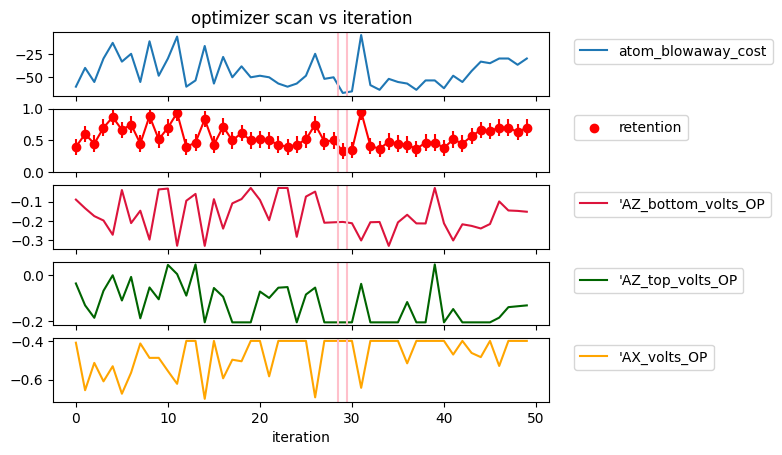

best cost (iter. 29): -66.66666666666667
best 'AZ_bottom_volts_OP: -0.2048999781069587
best 'AZ_top_volts_OP: -0.205
best 'AX_volts_OP: -0.4


Text(0.5, 0, 'atom_blowaway_cost')

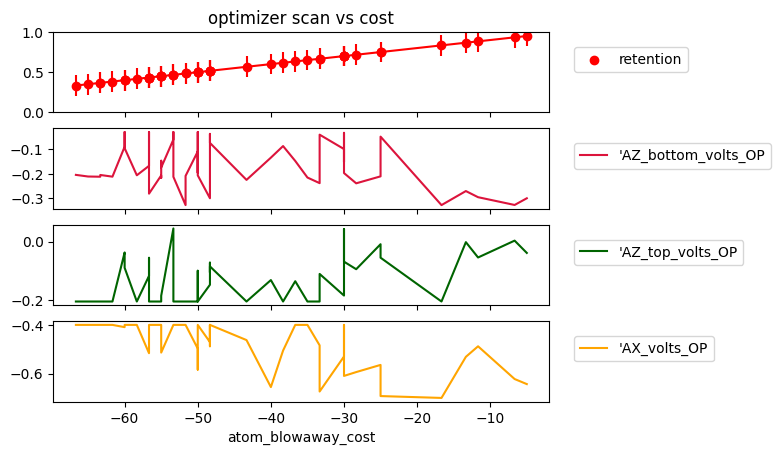

In [52]:
f_idx = 33

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0[1:])

cost = cost[1:] # the first entry is 0, which makes len(cost) == iterations+1

if recompute_cost and not require_atom_loading_to_advance:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    if cost_function == 'atom_blowaway_cost':
        cost = -100*(1-retention)
    elif cost_function == 'atom_retention_cost':
        cost = -100*retention
    else:
        print(f"oops, you need to compute the cost here according to {cost_function}!")
        raise NotImplementedError
elif require_atom_loading_to_advance:
    errs = np.array([1/np.sqrt(n_measurements) for i in range(iterations)])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        print(f"oops, you need to compute the cost here according to {cost_function}!")
        raise NotImplementedError
else:
    _, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)
    errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded])

    # compute retention from cost
    if cost_function == 'atom_blowaway_cost':
        retention = 1+cost/100
    elif cost_function == 'atom_retention_cost':
        retention = -cost/100
    else:
        print(f"oops, you need to compute the cost here according to {cost_function}!")
        raise NotImplementedError
        
nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+2, sharex=True)
ax = axes[0]
ax.set_title("optimizer scan vs iteration")
ax.plot(cost, label=cost_function)
ax.legend(loc=loc)
ax = axes[1]
ax.plot(retention, color='red')
ax.scatter(range(iterations), retention, label='retention', color='red')
ax.errorbar(range(iterations), retention, errs, ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

colors = ['crimson','darkgreen','orange','magenta','cyan','purple']
for i, ax in enumerate(axes[2:]):
    ax.plot(locals()[f'optimizer_var{i}'][1:], label=str(optimizer_vars_dataset[i])[1:-1], color=colors[i])
    ax.legend(loc=loc)
ax.set_xlabel("iteration")

best_cost_iteration = np.argmin(cost)

for ax in axes:
    ax.axvline(best_cost_iteration-0.5,color='pink')
    ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()
print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

sorted_idcs = np.argsort(cost) # sort by cost

fig,axes = plt.subplots(nrows=nvars+1, sharex=True)
ax = axes[0]
ax.set_title("optimizer scan vs cost")
ax.plot(cost[sorted_idcs],retention[sorted_idcs], color='red')
ax.scatter(cost[sorted_idcs], retention[sorted_idcs], label='retention', color='red')
ax.errorbar(cost[sorted_idcs], retention[sorted_idcs], errs[sorted_idcs], ls='none', color='red')
ax.set_ylim(0,1)
ax.legend(loc=loc)

colors = ['crimson','darkgreen','orange','magenta','cyan','purple']
for i, ax in enumerate(axes[1:]):
    ax.plot(cost[sorted_idcs], locals()[f'optimizer_var{i}'][1:][sorted_idcs], label=str(optimizer_vars_dataset[i])[1:-1], color=colors[i])
    ax.legend(loc=loc)
ax.set_xlabel(cost_function)

# for ax in axes:
#     ax.axvline(cost[0]-0.5,color='pink')
#     ax.axvline(cost[0]+0.5,color='pink')

# plt.show()
# print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration]}")
# for i in range(nvars):
#     print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

In [47]:
best_cost_iteration

0

In [41]:
sorted_idcs = np.argsort(cost)

In [42]:
retention[sorted_idcs]

array([0.33333333, 0.35      , 0.36666667, 0.36666667, 0.38333333,
       0.4       , 0.4       , 0.4       , 0.41666667, 0.43333333,
       0.43333333, 0.43333333, 0.43333333, 0.45      , 0.45      ,
       0.45      , 0.45      , 0.46666667, 0.46666667, 0.46666667,
       0.48333333, 0.48333333, 0.5       , 0.5       , 0.5       ,
       0.5       , 0.51666667, 0.51666667, 0.51666667, 0.51666667,
       0.56666667, 0.6       , 0.61666667, 0.63333333, 0.65      ,
       0.66666667, 0.66666667, 0.7       , 0.7       , 0.7       ,
       0.7       , 0.7       , 0.71666667, 0.75      , 0.75      ,
       0.83333333, 0.86666667, 0.88333333, 0.93333333, 0.95      ])

In [ ]:
errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))

In [48]:
np.argsort?

Signature:       np.argsort(a, axis=-1, kind=None, order=None)
Call signature:  np.argsort(*args, **kwargs)
Type:            _ArrayFunctionDispatcher
String form:     <function argsort at 0x0000014C2BB1DEE0>
File:            c:\users\qc\.virtualenvs\networking_exp_data-0orq_j3c\lib\site-packages\numpy\core\fromnumeric.py
Docstring:      
Returns the indices that would sort an array.

Perform an indirect sort along the given axis using the algorithm specified
by the `kind` keyword. It returns an array of indices of the same shape as
`a` that index data along the given axis in sorted order.

Parameters
----------
a : array_like
    Array to sort.
axis : int or None, optional
    Axis along which to sort.  The default is -1 (the last axis). If None,
    the flattened array is used.
kind : {'quicksort', 'mergesort', 'heapsort', 'stable'}, optional
    Sorting algorithm. The default is 'quicksort'. Note that both 'stable'
    and 'mergesort' use timsort under the covers and, in general, the

### 2024.08.29

In [16]:
fnames = get_files_by_criteria(date_filters=["2024-08-28"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]

                # print()
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 8 files
file 0 (...results\2024-08-28\13\000016983-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'"] for 'atom_blowaway_cost'
file 1 (...results\2024-08-28\15\000016985-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 3 (...results\2024-08-28\16\000016986-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 4 (...results\2024-08-28\16\000016987-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 5 (...results\2024-08-28\18\000016989-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'"] for 'atom_blowaway_cost'
file 6 (...results\2024-08-28\19\000016990-GeneralVariableScan.h5) scanned over f_microwaves_dds
skipped 2 redundant files
2 scan_variables over 4 variable scans


### optimizing optical pumping with OP shims

experiment: microwave_Rabi_experiment


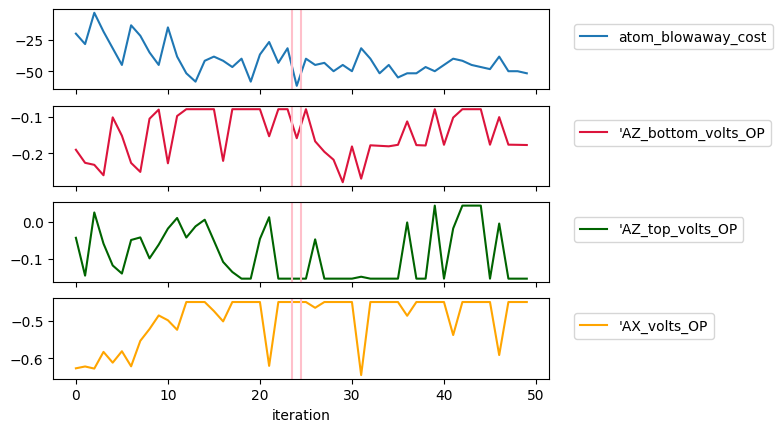

best cost (iter. 24): -61.66666666666667
best 'AZ_bottom_volts_OP: -0.15846521920130763
best 'AZ_top_volts_OP: -0.155
best 'AX_volts_OP: -0.4500000000000001


In [18]:
f_idx = 5

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0[1:])

if recompute_cost:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    if cost_function == 'atom_blowaway_cost':
        cost = -100*(1-retention)
    elif cost_function == 'atom_retention_cost':
        cost = -100*retention
    else:
        print(f"oops, you need to compute the cost here according to {cost_function}!")
        raise NotImplementedError

nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+1, sharex=True)
ax = axes[0]
ax.plot(cost[1:], label=cost_function)
ax.legend(loc=loc)
colors = ['crimson','darkgreen','orange','magenta','cyan','purple']
for i, ax in enumerate(axes[1:]):
    ax.plot(locals()[f'optimizer_var{i}'][1:], label=str(optimizer_vars_dataset[i])[1:-1], color=colors[i])
    ax.legend(loc=loc)
ax.set_xlabel("iteration")

best_cost_iteration = np.argmin(cost)-1

for ax in axes:
    ax.axvline(best_cost_iteration-0.5,color='pink')
    ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()
print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration+1]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

(array([ 68., 174.,  81.,  18.,  23., 103., 150., 121.,  34.,   8.]),
 array([18533.33333333, 22193.33333333, 25853.33333333, 29513.33333333,
        33173.33333333, 36833.33333333, 40493.33333333, 44153.33333333,
        47813.33333333, 51473.33333333, 55133.33333333]),
 <BarContainer object of 10 artists>)

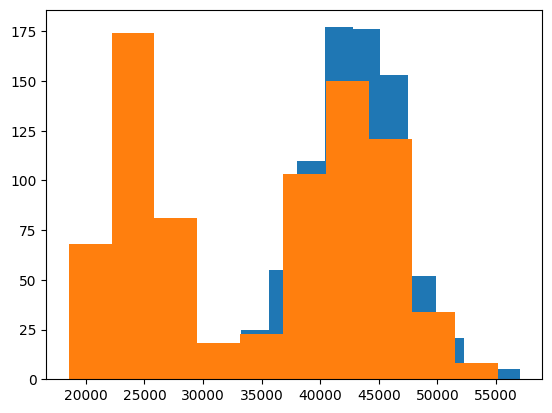

In [75]:
plt.hist(photocounts/0.015)
plt.hist(photocounts2/0.015)

### 2024.08.28

In [19]:
fnames = get_files_by_criteria(date_filters=["2024-08-28"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariable"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]

                # print()
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 8 files
file 0 (...results\2024-08-28\13\000016983-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'"] for 'atom_blowaway_cost'
file 1 (...results\2024-08-28\15\000016985-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 3 (...results\2024-08-28\16\000016986-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 4 (...results\2024-08-28\16\000016987-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 5 (...results\2024-08-28\18\000016989-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'"] for 'atom_blowaway_cost'
file 6 (...results\2024-08-28\19\000016990-GeneralVariableScan.h5) scanned over f_microwaves_dds
skipped 2 redundant files
2 scan_variables over 4 variable scans


### optimizing optical pumping with OP shims

experiment: microwave_Rabi_experiment


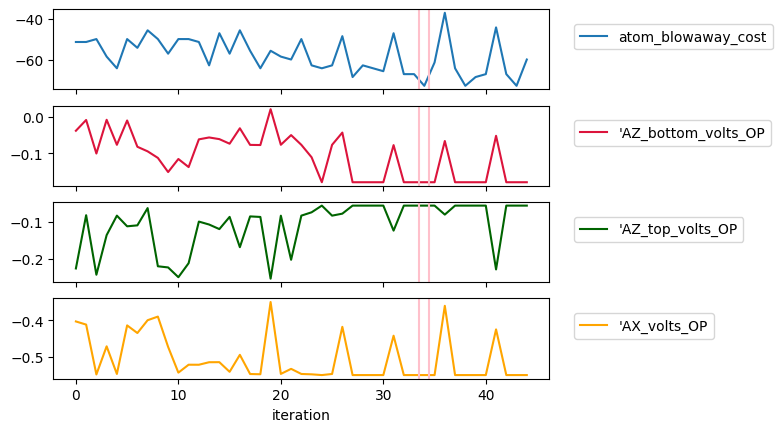

best cost (iter. 34): -72.85714285714286
best 'AZ_bottom_volts_OP: -0.179
best 'AZ_top_volts_OP: -0.05499999999999999
best 'AX_volts_OP: -0.55


In [20]:
f_idx = 0

recompute_cost = False # todo, recompute the cost based on the raw data
loc = (1.05,0.5) # where to put the legend

f = h5py.File(os.path.join(results, fnames[f_idx]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
iterations = len(optimizer_var0[1:])

if recompute_cost:
    cutoff1 = threshold_otsu(photocounts)
    cutoff2 = threshold_otsu(photocounts2)

    retention, loading_rate, n_atoms_loaded = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    if cost_function == 'atom_blowaway_cost':
        cost = -100*(1-retention)
    elif cost_function == 'atom_retention_cost':
        cost = -100*retention
    else:
        print(f"oops, you need to compute the cost here according to {cost_function}!")
        raise NotImplementedError

nvars = len(optimizer_vars_dataset)
fig,axes = plt.subplots(nrows=nvars+1, sharex=True)
ax = axes[0]
ax.plot(cost[1:], label=cost_function)
ax.legend(loc=loc)
colors = ['crimson','darkgreen','orange','magenta','cyan','purple']
for i, ax in enumerate(axes[1:]):
    ax.plot(locals()[f'optimizer_var{i}'][1:], label=str(optimizer_vars_dataset[i])[1:-1], color=colors[i])
    ax.legend(loc=loc)
ax.set_xlabel("iteration")

best_cost_iteration = np.argmin(cost)-1

for ax in axes:
    ax.axvline(best_cost_iteration-0.5,color='pink')
    ax.axvline(best_cost_iteration+0.5,color='pink')

plt.show()
print(f"best cost (iter. {best_cost_iteration}): {cost[best_cost_iteration+1]}")
for i in range(nvars):
    print(f"best {str(optimizer_vars_dataset[i])[1:-1]}: {locals()[f'optimizer_var{i}'][best_cost_iteration+1]}")

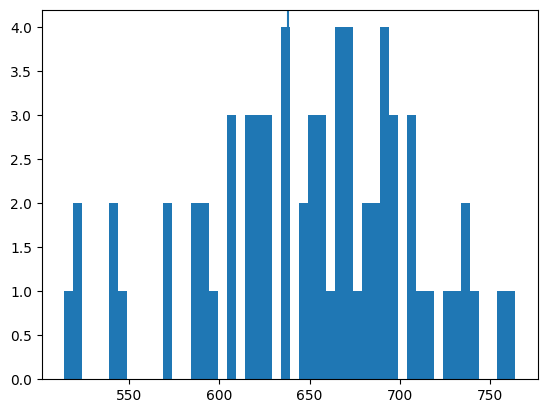

In [69]:
fig,ax = plt.subplots()
ax.hist(photocounts[:70],bins=50)
ax.axvline(cutoff1)